**Artículo:** Development of Machine Learning and Deep Learning Prediction Models for PM2.5 in Ho Chi Minh City, Vietnam

**Autores:** Phuc Hieu Nguyen, Nguyen Khoi Dao y Ly Sy Phu Nguyen

**Resumen:**
Este artículo presenta un estudio enfocado en la predicción de concentraciones de PM2.5 en Ciudad Ho Chi Minh, Vietnam, mediante el uso de algoritmos de aprendizaje automático y aprendizaje profundo. La investigación busca abordar los problemas de contaminación atmosférica en entornos urbanos utilizando modelos de inteligencia artificial capaces de analizar relaciones complejas entre variables meteorológicas y niveles de contaminación.

Los autores recopilaron datos durante 911 días, incluyendo variables como temperatura, humedad, velocidad del viento, precipitaciones, evaporación y horas de sol. Con esta información, desarrollaron y evaluaron distintos modelos predictivos utilizando algoritmos como Random Forest (RF), XGBoost (XGB), Support Vector Regression (SVR), Artificial Neural Networks (ANN), Generalized Regression Neural Networks (GRNN) y Convolutional Neural Networks (CNN).

El estudio demuestra que los modelos basados en inteligencia artificial pueden mejorar significativamente la precisión en la predicción de la calidad del aire. Entre todos los algoritmos evaluados, el modelo ANN obtuvo el mejor desempeño, alcanzando los valores más altos de precisión y los menores errores de predicción en comparación con los demás modelos analizados.

Además, la investigación destaca que factores meteorológicos como la humedad, temperatura y velocidad del viento presentan una fuerte correlación con las concentraciones de PM2.5, lo que permite optimizar el rendimiento de los modelos predictivos. Los resultados evidencian que el uso de técnicas de aprendizaje profundo ofrece ventajas importantes en el monitoreo ambiental y en la toma de decisiones relacionadas con la salud pública y la gestión de la contaminación atmosférica.

En conclusión, este trabajo resalta el potencial de los algoritmos de machine learning y deep learning para mejorar la predicción de contaminación del aire en ciudades altamente urbanizadas. Los autores señalan que estos modelos pueden servir como herramientas útiles para que autoridades ambientales y responsables de políticas públicas implementen estrategias preventivas y acciones orientadas a reducir los riesgos asociados a la contaminación atmosférica.

**Artículo:** Evaluación de modelos de series temporales de aprendizaje profundo para PM2.5 Forecasting Through Diverse Horizons

**Autores:** Ling Zeng, Runan Dong, Meng Yuan, Linhai Jing y Shoutao Jiao

**Resumen:**
Este artículo analiza el desempeño de distintos modelos de aprendizaje profundo para la predicción de concentraciones de PM2.5 en Chengdu, China, una ciudad caracterizada por altos niveles de contaminación atmosférica debido a factores urbanos, industriales y meteorológicos. El estudio evalúa arquitecturas avanzadas de series temporales con el objetivo de identificar los modelos más efectivos para pronósticos de calidad del aire en diferentes horizontes temporales.

Los autores compararon cuatro algoritmos principales: LSTM, CNN-LSTM, Transformer y Transformer-LSTM, utilizando configuraciones univariantes y multivariantes que integran contaminantes auxiliares como CO, NO2, O3 y SO2, además de variables meteorológicas como temperatura, presión atmosférica, precipitación y velocidad del viento. El análisis se realizó utilizando dos años de datos diarios recolectados entre 2022 y 2024.

Los resultados demostraron que el modelo híbrido Transformer-LSTM obtuvo el mejor desempeño predictivo, alcanzando mayores valores de precisión y menores errores en comparación con los demás modelos evaluados. Asimismo, se evidenció que la incorporación de variables meteorológicas mejora significativamente la capacidad predictiva de los modelos, superando el impacto de los contaminantes auxiliares tradicionales.

El estudio también concluye que los modelos entrenados con datos completos de las cuatro estaciones del año presentan una mayor estabilidad y precisión en las predicciones, mientras que grandes intervalos de tiempo entre entrenamiento y predicción reducen notablemente la confiabilidad de los resultados. Además, se identificó que la temperatura es la variable meteorológica con mayor influencia en la dinámica del PM2.5.

En general, esta investigación resalta el potencial de los modelos híbridos basados en deep learning para mejorar los sistemas de monitoreo y predicción de contaminación atmosférica. Los autores destacan que estas metodologías pueden convertirse en herramientas clave para apoyar la toma de decisiones de políticas públicas y estrategias de control ambiental orientadas a reducir los riesgos asociados a la contaminación del aire en grandes ciudades.

In [3]:
import pandas as pd
import seaborn as sns
import missingno as msno
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
import warnings
import itertools
import matplotlib.dates as mdates
import calendar
from scipy.signal import find_peaks
from IPython.display import Image

from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    mean_absolute_percentage_error,
    r2_score
)

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn import tree
from sklearn.preprocessing import MinMaxScaler



warnings.filterwarnings('ignore')


In [ ]:
df_estación_compartir = pd.read_csv("2014_ene_01_2020-compartir.csv", sep=";", encoding="latin1", dtype={'Fecha & Hora': str})

df_estación_compartir.columns = df_estación_compartir.columns.str.replace('ï»¿', '')

df_estación_compartir.head()

,Fecha & Hora,PM10 (ug/m3),"PM2,5 (ug/m3)",O3 (ug/m3),Vel Viento (m/s),Dir Viento (Grados),Temperatura (CÂ°),Humedad (%),Radiacion Solar (Watt/M2),Lluvia (mm)
0,2014-01-30T11:00:00,ND,ND,"61,4",ND,ND,ND,ND,ND,ND
1,2014-01-30T12:00:00,ND,ND,"69,04",ND,ND,"27,1","61,9","501,4",0
2,2014-01-30T13:00:00,ND,ND,"93,19",ND,ND,"27,4","59,9","326,6",0
3,2014-01-30T14:00:00,ND,ND,"85,03",ND,ND,"28,5","54,1",541,0
4,2014-01-30T15:00:00,ND,ND,"52,98",ND,ND,"28,4","56,4","248,8",0


# **EDA ANTES DE LIMPIEZA**

In [ ]:
df_estación_compartir.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51878 entries, 0 to 51877
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Fecha & Hora               51878 non-null  object
 1   PM10 (ug/m3)               51878 non-null  object
 2   PM2,5 (ug/m3)              51878 non-null  object
 3   O3  (ug/m3)                51878 non-null  object
 4   Vel Viento  (m/s)          51878 non-null  object
 5   Dir Viento (Grados)        51878 non-null  object
 6   Temperatura (CÂ°)          51878 non-null  object
 7   Humedad (%)                51878 non-null  object
 8   Radiacion Solar (Watt/M2)  51868 non-null  object
 9   Lluvia (mm)                51878 non-null  object
dtypes: object(10)
memory usage: 4.0+ MB


In [ ]:
df_estación_compartir = df_estación_compartir.replace("ND", pd.NA)

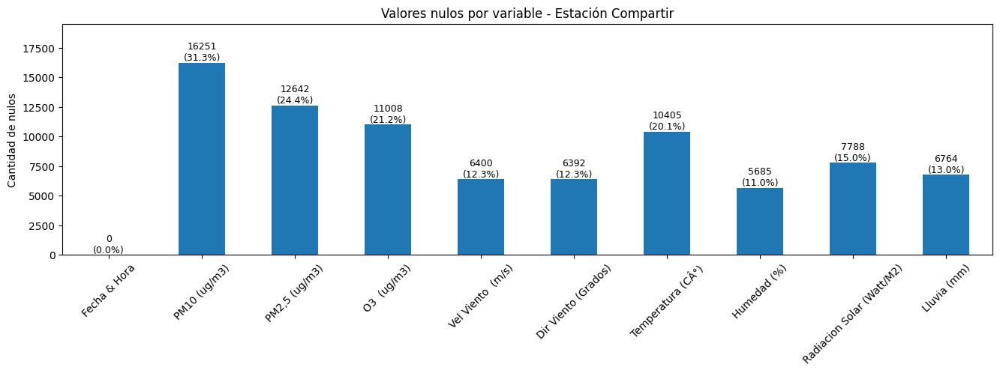

In [ ]:
nulos = df_estación_compartir.isna().sum()
total = len(df_estación_compartir)

plt.figure(figsize=(16,4))
ax = nulos.plot(kind="bar")

for i, v in enumerate(nulos):
    porcentaje = (v/total)*100
    ax.text(i, v, f"{v}\n({porcentaje:.1f}%)",
            ha='center', va='bottom', fontsize=9)

plt.ylim(0, nulos.max()*1.2)
plt.title("Valores nulos por variable - Estación Compartir")
plt.ylabel("Cantidad de nulos")
plt.xticks(rotation=45)

plt.show()

## A. LIMPIEZA Y ESTANDARIZACIÓN DE LA COLUMNA (FECHA Y HORA)

In [ ]:
df_estación_compartir['Fecha & Hora'].dtype

dtype('O')

In [ ]:
# 1. Asegurar string y quitar T
mask_T = df_estación_compartir['Fecha & Hora'].str.contains('T', na=False)

df_estación_compartir.loc[mask_T, 'Fecha & Hora'] = df_estación_compartir.loc[mask_T, 'Fecha & Hora'].str.replace('T', ' ')

print("Filas modificadas:", mask_T.sum())

Filas modificadas: 43118


In [ ]:
# 2. Convertir números
mask_num = df_estación_compartir['Fecha & Hora'].str.strip().str.match(r'^\d+(\.\d+)?$', na=False)

df_estación_compartir.loc[mask_num, 'Fecha & Hora'] = pd.to_datetime(
    df_estación_compartir.loc[mask_num, 'Fecha & Hora'].astype(float),
    origin='1899-12-30',
    unit='D'
)

print("Filas convertidas (Excel):", mask_num.sum())

Filas convertidas (Excel): 364


In [ ]:
# Ejemplo de validación
val = df_estación_compartir.iloc[45085]['Fecha & Hora']
print(val)
print(type(val))
print(repr(val))

2019-03-24 00:00:00
<class 'pandas._libs.tslibs.timestamps.Timestamp'>
Timestamp('2019-03-24 00:00:00')


In [ ]:
df_estación_compartir['Fecha & Hora'].dtype

dtype('O')

In [ ]:
mask_ddmm = df_estación_compartir['Fecha & Hora'].str.contains(r'\d{1,2}/\d{1,2}/\d{2,4}', na=False)

df_estación_compartir.loc[mask_ddmm, 'Fecha & Hora'] = pd.to_datetime(
    df_estación_compartir.loc[mask_ddmm, 'Fecha & Hora'],
    dayfirst=True
)

print("Filas convertidas (DD/MM):", mask_ddmm.sum())

Filas convertidas (DD/MM): 8396


In [ ]:
# Ejemplo de validación
val = df_estación_compartir.iloc[43160]['Fecha & Hora']
print(val)
print(type(val))
print(repr(val))

2019-01-02 19:00:00
<class 'pandas._libs.tslibs.timestamps.Timestamp'>
Timestamp('2019-01-02 19:00:00')


In [ ]:
df_estación_compartir['Fecha & Hora'].dtype

dtype('O')

In [ ]:
# 4. Cambio tipo de variable
df_estación_compartir['Fecha & Hora'] = pd.to_datetime(
    df_estación_compartir['Fecha & Hora']
)

In [ ]:
df_estación_compartir['Fecha & Hora'].dtype

dtype('<M8[ns]')

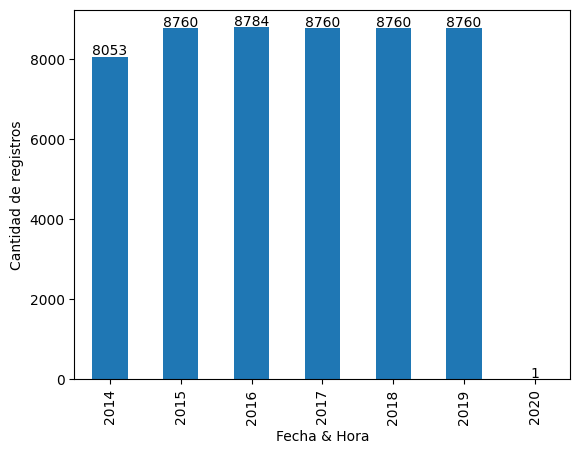

In [ ]:
conteo = df_estación_compartir.groupby(
    df_estación_compartir['Fecha & Hora'].dt.year
).size()

ax = conteo.plot(kind='bar')

ax.set_ylabel('Cantidad de registros')
ax.set_xlabel('Fecha & Hora')

# Mostrar valores en cada barra
for i, v in enumerate(conteo):
    ax.text(i, v + 50, str(v), ha='center')

**Análisis de completitud de datos por año**

Años bisiestos:

2016 → 366 días × 24 horas = 8784 registros

Años completos:

2015, 2017, 2018, 2019 → 365 días × 24 horas = 8760 registros

Años incompletos:

2014 → 8053 registros (~335 días) → dataset inicia a mitad de año

2020 → 1 registro (~0 días) → dato residual, debe eliminarse

## B. REVISIÓN DE RANGO (2014-2019)

In [ ]:
# Fecha inicial y fecha final del dataset

fecha_inicial = df_estación_compartir['Fecha & Hora'].min()
fecha_final = df_estación_compartir['Fecha & Hora'].max()

print("Fecha inicial:", fecha_inicial)
print("Fecha final:", fecha_final)

Fecha inicial: 2014-01-30 11:00:00
Fecha final: 2020-01-01 00:00:00


## C. REVISIÓN FORMATO Y TIPO DE DATO DE LA COLUMNA (FECHA Y HORA)

* YYYY-MM-DD HH:MM:SS

In [ ]:
print("Tipo:", df_estación_compartir['Fecha & Hora'].dtype)

ejemplo = (
    df_estación_compartir['Fecha & Hora']
    .sample(5)
    .dt.strftime('%Y-%m-%d %H:%M:%S')
)

print("Ejemplos aleatorios:")
print(ejemplo)

Tipo: datetime64[ns]
Ejemplos aleatorios:
20296    2016-05-25 03:00:00
24301    2016-11-08 00:00:00
18444    2016-03-08 23:00:00
18854    2016-03-26 01:00:00
34403    2018-01-02 22:00:00
Name: Fecha & Hora, dtype: object


## D. REVISIÓN ORDEN DE FECHAS

* La gráfica usa la columna tal cual está, NO cambia el orden de la columna
* Línea sube suave → bien
* subida brusca → fecha se adelanta
* Baja → fecha retrocede
* “dientes” → desorden/mal formato

Total de registros: 51878


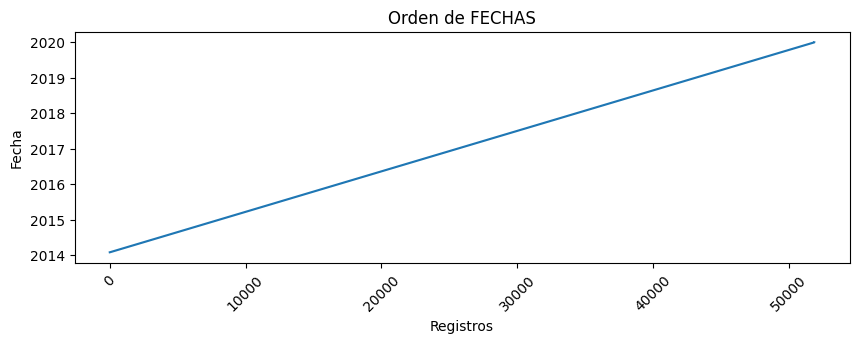

In [ ]:
fechas = df_estación_compartir['Fecha & Hora'].dt.date

print("Total de registros:", len(fechas))

plt.figure(figsize=(10,3))
plt.plot(range(len(fechas)), fechas)

plt.title('Orden de FECHAS')
plt.xlabel('Registros')
plt.ylabel('Fecha')

plt.xticks(rotation=45)
plt.show()

## E. REVISIÓN 24 HORAS POR DÍA

In [ ]:
# Agrupación por día
df_estación_compartir['fecha'] = (
    df_estación_compartir['Fecha & Hora']
    .dt.floor('D')
)

horas = df_estación_compartir.groupby('fecha').size()

print(f"Cantidad de registros: {len(df_estación_compartir)}")

# Totales
total_dias = len(horas)
dias_completos = (horas == 24).sum()
dias_incompletos = (horas != 24)

print(f"Total días: {total_dias}")
print(f"Días completos (24h): {dias_completos}")
print(f"Días incompletos: {dias_incompletos.sum()}")

# Detalle de días incompletos
if dias_incompletos.sum() > 0:
    print("\nDías incompletos (fecha → horas):")
    print(horas[dias_incompletos])

Cantidad de registros: 51878
Total días: 2163
Días completos (24h): 2161
Días incompletos: 2

Días incompletos (fecha → horas):
fecha
2014-01-30    13
2020-01-01     1
dtype: int64


In [ ]:
df_estación_compartir['fecha'] = (
    df_estación_compartir['Fecha & Hora']
    .dt.floor('D')
)

df_estación_compartir['hora'] = (
    df_estación_compartir['Fecha & Hora']
    .dt.hour
)

dias_malos = []

for fecha, grupo in df_estación_compartir.groupby('fecha'):
    horas = sorted(grupo['hora'].tolist())

    if horas != list(range(24)):
        dias_malos.append((fecha, horas))

print(f"Días con horas incompletas: {len(dias_malos)}")

if dias_malos:
    print("Ejemplo del día con las horas que tiene:")
    for d in dias_malos[:3]:
        print(d)

Días con horas incompletas: 2
Ejemplo del día con las horas que tiene:
(Timestamp('2014-01-30 00:00:00'), [11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23])
(Timestamp('2020-01-01 00:00:00'), [0])


In [ ]:
antes = len(df_estación_compartir)

df_estación_compartir = df_estación_compartir[
    df_estación_compartir['Fecha & Hora'].dt.date != pd.to_datetime('2020-01-01').date()
]

print("Filas eliminadas:", antes - len(df_estación_compartir))

Filas eliminadas: 1


In [ ]:
df_estación_compartir.drop(columns=['fecha', 'hora'], inplace=True)

## F. RENOMBRE DE COLUMNAS

In [ ]:
def limpiar_nombres_de_columnas(df):

    df.columns = (
        df.columns
        .str.strip()
        .str.replace('\n', ' ', regex=False)
        .str.replace('  ', ' ', regex=False)
    )

    mapeo = {
        'PM10 (ug/m3)': 'PM10 (ug/m3)',
        'PM2,5 (ug/m3)': 'PM2.5 (ug/m3)',
        'O3 (ug/m3)': 'O3 (ug/m3)',
        'Vel Viento (m/s)': 'Vel Viento (m/s)',
        'Dir Viento (Grados)': 'Dir Viento (grados)',
        'Temperatura (CÂ°)': 'Temperatura (°C)',
        'Humedad (%)': 'Humedad (%)',
        'Radiacion Solar (Watt/M2)': 'Radiacion Solar (W/m2)',
        'Lluvia (mm)': 'Lluvia (mm)'
    }

    df = df.rename(columns=mapeo)

    print(list(df.columns))

    return df

In [ ]:
df_estación_compartir = limpiar_nombres_de_columnas(df_estación_compartir)

['Fecha & Hora', 'PM10 (ug/m3)', 'PM2.5 (ug/m3)', 'O3 (ug/m3)', 'Vel Viento (m/s)', 'Dir Viento (grados)', 'Temperatura (°C)', 'Humedad (%)', 'Radiacion Solar (W/m2)', 'Lluvia (mm)']


In [ ]:
df_estación_compartir.head()

,Fecha & Hora,PM10 (ug/m3),PM2.5 (ug/m3),O3 (ug/m3),Vel Viento (m/s),Dir Viento (grados),Temperatura (°C),Humedad (%),Radiacion Solar (W/m2),Lluvia (mm)
0,2014-01-30 11:00:00,<NA>,<NA>,"61,4",<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1,2014-01-30 12:00:00,<NA>,<NA>,"69,04",<NA>,<NA>,"27,1","61,9","501,4",0
2,2014-01-30 13:00:00,<NA>,<NA>,"93,19",<NA>,<NA>,"27,4","59,9","326,6",0
3,2014-01-30 14:00:00,<NA>,<NA>,"85,03",<NA>,<NA>,"28,5","54,1",541,0
4,2014-01-30 15:00:00,<NA>,<NA>,"52,98",<NA>,<NA>,"28,4","56,4","248,8",0


In [ ]:
df_estación_compartir.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51877 entries, 0 to 51876
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Fecha & Hora            51877 non-null  datetime64[ns]
 1   PM10 (ug/m3)            35626 non-null  object        
 2   PM2.5 (ug/m3)           39235 non-null  object        
 3   O3 (ug/m3)              40869 non-null  object        
 4   Vel Viento (m/s)        45477 non-null  object        
 5   Dir Viento (grados)     45485 non-null  object        
 6   Temperatura (°C)        41472 non-null  object        
 7   Humedad (%)             46192 non-null  object        
 8   Radiacion Solar (W/m2)  44089 non-null  object        
 9   Lluvia (mm)             45113 non-null  object        
dtypes: datetime64[ns](1), object(9)
memory usage: 4.4+ MB


## G. ESTANDARIZACIÓN DE DATOS POR COLUMNA

In [ ]:
cols = df_estación_compartir.columns[1:]

for col in cols:
    coma_punto = 0
    espacios = 0
    nan_vacios = 0
    nan_invalidos = 0
    valores_raros = set()

    for i in df_estación_compartir.index:
        original = df_estación_compartir.at[i, col]
        nuevo = original

        if isinstance(nuevo, str):

            # espacios
            if nuevo != nuevo.strip():
                espacios += 1
            nuevo = nuevo.strip()

            # coma a punto
            if ',' in nuevo:
                coma_punto += 1
            nuevo = nuevo.replace(',', '.')

            # vacíos
            if nuevo in ['', 'nan', 'None']:
                nan_vacios += 1
                df_estación_compartir.at[i, col] = pd.NA
                continue

        # conversión
        try:
            nuevo = float(nuevo)
        except:
            nan_invalidos += 1
            valores_raros.add(str(original))
            nuevo = pd.NA

        df_estación_compartir.at[i, col] = nuevo

    # PRINTS
    print(f"\n{col}")
    print(f"  Coma → punto: {coma_punto}")
    print(f"  Espacios quitados: {espacios}")
    print(f"  NaN por vacíos: {nan_vacios}")
    print(f"  NaN por inválidos: {nan_invalidos}")

    if valores_raros:
        print(f"  Ejemplos valores raros: {list(valores_raros)[:10]}")

# columnas a float
df_estación_compartir[cols] = df_estación_compartir[cols].apply(
    pd.to_numeric,
    errors='coerce'
)

# Verificación final
print("\nTIPOS DE DATOS FINALES:")
print(df_estación_compartir.dtypes)


PM10 (ug/m3)
  Coma → punto: 0
  Espacios quitados: 0
  NaN por vacíos: 0
  NaN por inválidos: 16251
  Ejemplos valores raros: ['<NA>']

PM2.5 (ug/m3)
  Coma → punto: 0
  Espacios quitados: 0
  NaN por vacíos: 0
  NaN por inválidos: 12642
  Ejemplos valores raros: ['<NA>']

O3 (ug/m3)
  Coma → punto: 38554
  Espacios quitados: 0
  NaN por vacíos: 0
  NaN por inválidos: 11008
  Ejemplos valores raros: ['<NA>']

Vel Viento (m/s)
  Coma → punto: 40950
  Espacios quitados: 0
  NaN por vacíos: 0
  NaN por inválidos: 6400
  Ejemplos valores raros: ['<NA>']

Dir Viento (grados)
  Coma → punto: 40899
  Espacios quitados: 0
  NaN por vacíos: 0
  NaN por inválidos: 6392
  Ejemplos valores raros: ['<NA>']

Temperatura (°C)
  Coma → punto: 37415
  Espacios quitados: 0
  NaN por vacíos: 0
  NaN por inválidos: 10405
  Ejemplos valores raros: ['<NA>']

Humedad (%)
  Coma → punto: 41575
  Espacios quitados: 0
  NaN por vacíos: 0
  NaN por inválidos: 5685
  Ejemplos valores raros: ['<NA>']

Radiacion 

In [ ]:
df_estación_compartir.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51877 entries, 0 to 51876
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Fecha & Hora            51877 non-null  datetime64[ns]
 1   PM10 (ug/m3)            35626 non-null  float64       
 2   PM2.5 (ug/m3)           39235 non-null  float64       
 3   O3 (ug/m3)              40869 non-null  float64       
 4   Vel Viento (m/s)        45477 non-null  float64       
 5   Dir Viento (grados)     45485 non-null  float64       
 6   Temperatura (°C)        41472 non-null  float64       
 7   Humedad (%)             46192 non-null  float64       
 8   Radiacion Solar (W/m2)  44089 non-null  float64       
 9   Lluvia (mm)             45113 non-null  float64       
dtypes: datetime64[ns](1), float64(9)
memory usage: 6.4 MB


## H. IMPUTACIÓN DE VALORES FALTANTES

In [ ]:
cols = df_estación_compartir.columns[1:]

for col in cols:
    ceros = (df_estación_compartir[col] == 0).sum()
    print(f"{col}: {ceros} ceros")

PM10 (ug/m3): 0 ceros
PM2.5 (ug/m3): 9 ceros
O3 (ug/m3): 2 ceros
Vel Viento (m/s): 5 ceros
Dir Viento (grados): 6 ceros
Temperatura (°C): 0 ceros
Humedad (%): 0 ceros
Radiacion Solar (W/m2): 21615 ceros
Lluvia (mm): 42450 ceros


* Variable	Tipo	¿0 es posible?

Contaminantes → cuando la concentración es muy baja / bajo límite de detección

Vel Viento → calma total

Dir Viento → 0° = viento desde el norte

Radiacion Solar → noche

Lluvia → no lluvia

Temperatura → (no llega a 0°C en Cali)

Humedad → (0% no ocurre en Cali)

In [ ]:
tabla_nulos = pd.DataFrame({
    'Nulos': df_estación_compartir.isnull().sum(),
    'Porcentaje (%)': (
        df_estación_compartir.isnull().mean() * 100
    ).round(2)
})

tabla_nulos

,Nulos,Porcentaje (%)
Fecha & Hora,0,0.00
PM10 (ug/m3),16251,31.33
PM2.5 (ug/m3),12642,24.37
O3 (ug/m3),11008,21.22
Vel Viento (m/s),6400,12.34
Dir Viento (grados),6392,12.32
Temperatura (°C),10405,20.06
Humedad (%),5685,10.96
Radiacion Solar (W/m2),7788,15.01
Lluvia (mm),6764,13.04


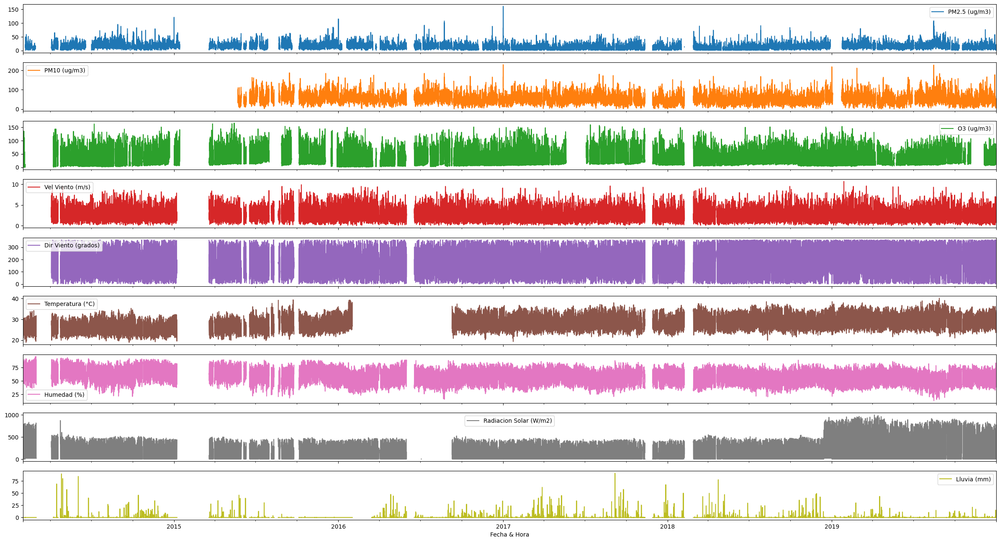

In [ ]:
cols = [
    "PM2.5 (ug/m3)",
    "PM10 (ug/m3)",
    "O3 (ug/m3)",
    "Vel Viento (m/s)",
    "Dir Viento (grados)",
    "Temperatura (°C)",
    "Humedad (%)",
    "Radiacion Solar (W/m2)",
    "Lluvia (mm)"
]

df_plot = df_estación_compartir.copy()

df_plot["Fecha & Hora"] = pd.to_datetime(
    df_plot["Fecha & Hora"]
)

df_plot = df_plot.set_index("Fecha & Hora")

plots = df_plot[cols]

_ = plots.plot(
    subplots=True,
    figsize=(30,16),
    sharex=True
)


In [ ]:
# ============================================================
# IMPUTACIÓN POR BLOQUES MENSUALES (mismo mes, otro año)
# ============================================================
# Para cada (variable, mes-año) con muchos NaN, busca un mes
# donante: mismo mes pero de otro año, con datos completos.
# Empareja por (día, hora) para preservar el ciclo diario.
# ============================================================

# Configuración
UMBRAL_VACIO    = 50.0
UMBRAL_DONANTE  = 85.0

cols_imputar = [
    "PM2.5 (ug/m3)",
    "PM10 (ug/m3)",
    "O3 (ug/m3)",
    "Vel Viento (m/s)",
    "Dir Viento (grados)",
    "Temperatura (°C)",
    "Humedad (%)",
    "Radiacion Solar (W/m2)",
    "Lluvia (mm)"
]

# Cargar y preparar
df = df_estación_compartir.copy()

df['Fecha & Hora'] = pd.to_datetime(df['Fecha & Hora'])

df = (
    df
    .sort_values('Fecha & Hora')
    .reset_index(drop=True)
)

df['_anio'] = df['Fecha & Hora'].dt.year
df['_mes']  = df['Fecha & Hora'].dt.month
df['_dia']  = df['Fecha & Hora'].dt.day
df['_hora'] = df['Fecha & Hora'].dt.hour

# Calcular % de completitud por (año, mes) para cada variable
completitud = {
    col: df.groupby(['_anio','_mes'])[col].apply(
        lambda x: 100 * x.notna().sum() / len(x)
        if len(x) > 0 else 0
    )
    for col in cols_imputar
}

# Imputar
df_imp = df.copy()

log_imputacion = []

for col in cols_imputar:

    serie_pct = completitud[col]

    for (anio, mes), pct in serie_pct.items():

        if pct >= UMBRAL_VACIO:
            continue

        # Buscar donante
        candidatos = []

        for (a, m), p in serie_pct.items():

            if (
                m == mes and
                a != anio and
                p >= UMBRAL_DONANTE
            ):

                candidatos.append(
                    (abs(a - anio), -p, a, p)
                )

        if not candidatos:

            log_imputacion.append((
                col,
                f"{anio}-{mes:02d}",
                round(pct,1),
                "SIN DONANTE",
                "-",
                0
            ))

            continue

        candidatos.sort()

        donante_anio = candidatos[0][2]
        donante_pct  = candidatos[0][3]

        # Donante
        donante = df[
            (df['_anio'] == donante_anio) &
            (df['_mes'] == mes)
        ]

        donante = (
            donante[
                ['_dia','_hora', col]
            ]
            .dropna(subset=[col])
        )

        donante_dict = (
            donante
            .set_index(['_dia','_hora'])[col]
            .to_dict()
        )

        # Aplicar imputación
        mask = (
            (df_imp['_anio'] == anio) &
            (df_imp['_mes'] == mes) &
            (df_imp[col].isna())
        )

        n_imputados = 0

        for i in df_imp[mask].index:

            key = (
                df_imp.at[i,'_dia'],
                df_imp.at[i,'_hora']
            )

            if key in donante_dict:

                df_imp.at[i, col] = donante_dict[key]

                n_imputados += 1

        log_imputacion.append((
            col,
            f"{anio}-{mes:02d}",
            round(pct,1),
            f"{donante_anio}-{mes:02d}",
            round(donante_pct,1),
            n_imputados
        ))

# Reporte
log_df = pd.DataFrame(
    log_imputacion,
    columns=[
        'Variable',
        'Mes_hueco',
        '%_valido_antes',
        'Mes_donante',
        '%_donante',
        'N_imputados'
    ]
)

print("PLAN DE IMPUTACIÓN APLICADO")

print(log_df.to_string(index=False))

print(
    f"\nTotal de valores imputados: "
    f"{log_df['N_imputados'].sum()}"
)

print("\n% NULOS ANTES vs DESPUÉS:")

for col in cols_imputar:

    pa = 100 * df[col].isna().sum() / len(df)

    pd_ = (
        100 *
        df_imp[col].isna().sum() /
        len(df_imp)
    )

    print(
        f"  {col:<25}  "
        f"{pa:6.2f}%  →  {pd_:6.2f}%"
    )

# Limpiar
df_imp = df_imp.drop(
    columns=['_anio','_mes','_dia','_hora']
)

print("\nImputación finalizada")

df_estación_compartir = df_imp.copy()

PLAN DE IMPUTACIÓN APLICADO
              Variable Mes_hueco  %_valido_antes Mes_donante  %_donante  N_imputados
         PM2.5 (ug/m3)   2014-01             0.0     2018-01       88.2           37
         PM2.5 (ug/m3)   2014-03             0.0     2019-03       89.4          665
         PM2.5 (ug/m3)   2015-01            39.4     2018-01       88.2          431
         PM2.5 (ug/m3)   2015-02             0.0     2016-02       95.1          648
         PM2.5 (ug/m3)   2015-03            33.2     2019-03       89.4          434
         PM2.5 (ug/m3)   2015-08            24.6     2014-08       98.5          552
         PM2.5 (ug/m3)   2016-06            41.9     2017-06       92.2          373
         PM2.5 (ug/m3)   2017-11            31.1     2018-11       99.9          495
         PM2.5 (ug/m3)   2018-02             5.4     2019-02       98.4          626
         PM2.5 (ug/m3)   2019-01            25.0     2018-01       88.2          473
          PM10 (ug/m3)   2014-01     

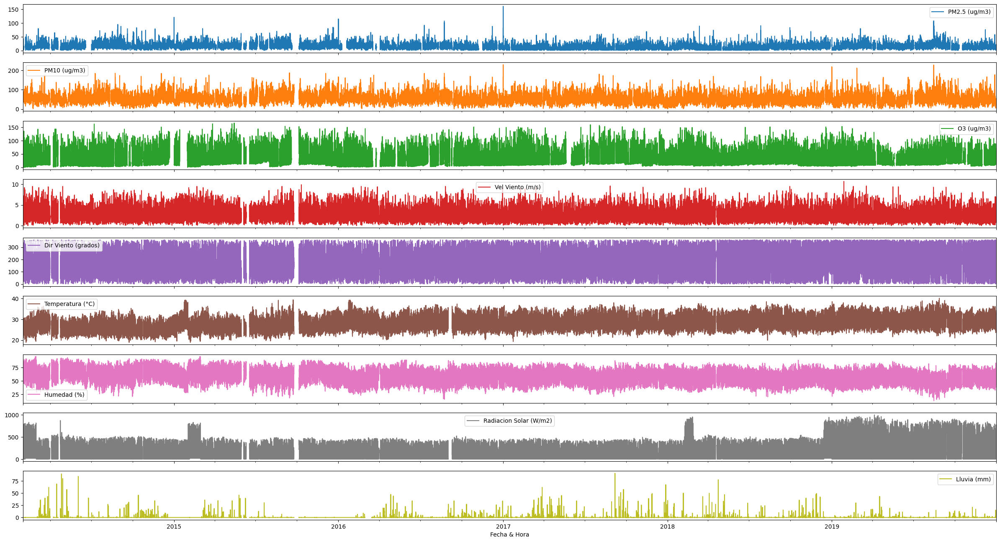

In [ ]:
cols = [
    "PM2.5 (ug/m3)",
    "PM10 (ug/m3)",
    "O3 (ug/m3)",
    "Vel Viento (m/s)",
    "Dir Viento (grados)",
    "Temperatura (°C)",
    "Humedad (%)",
    "Radiacion Solar (W/m2)",
    "Lluvia (mm)"
]

df_plot = df_estación_compartir.copy()

df_plot["Fecha & Hora"] = pd.to_datetime(
    df_plot["Fecha & Hora"]
)

df_plot = df_plot.set_index("Fecha & Hora")

plots = df_plot[cols]

_ = plots.plot(
    subplots=True,
    figsize=(30,16),
    sharex=True
)

In [ ]:
# ============================================================
# IMPUTACIÓN DE HUECOS RESIDUALES (después de imputación por bloques)
# Estrategia híbrida según tamaño del hueco y tipo de variable
# ============================================================


df_estación_compartir['Fecha & Hora'] = pd.to_datetime(
    df_estación_compartir['Fecha & Hora']
)

df_estación_compartir = (
    df_estación_compartir
    .sort_values('Fecha & Hora')
    .set_index('Fecha & Hora')
)

cols_continuas = [
    "PM2.5 (ug/m3)",
    "PM10 (ug/m3)",
    "O3 (ug/m3)",
    "Vel Viento (m/s)",
    "Temperatura (°C)",
    "Humedad (%)"
]

col_circular  = "Dir Viento (grados)"
col_radiacion = "Radiacion Solar (W/m2)"
col_lluvia    = "Lluvia (mm)"

todas_cols = (
    cols_continuas +
    [col_circular, col_radiacion, col_lluvia]
)

# HelperS
def rachas_nan(s):
    """Devuelve (ini, fin_exclusivo, longitud) de cada racha consecutiva de NaN."""
    isna = s.isna().values
    out, i, n = [], 0, len(isna)

    while i < n:

        if isna[i]:

            j = i

            while j < n and isna[j]:
                j += 1

            out.append((i, j, j - i))

            i = j

        else:
            i += 1

    return out


def mediana_hora_del_dia(
    serie_full,
    idx,
    ventana_dias
):
    """Mediana de la misma hora-del-día dentro de ±ventana_dias del timestamp objetivo."""

    ts = serie_full.index[idx]

    i0 = ts - pd.Timedelta(days=ventana_dias)
    i1 = ts + pd.Timedelta(days=ventana_dias)

    ven = serie_full.loc[i0:i1]

    cand = ven[
        ven.index.hour == ts.hour
    ].dropna()

    return (
        cand.median()
        if len(cand) > 0
        else np.nan
    )


def promedio_circular(angulos_deg):
    """Promedio circular en grados (para dirección de viento)."""

    a = np.array(angulos_deg, dtype=float)

    a = a[~np.isnan(a)]

    if len(a) == 0:
        return np.nan

    rad = np.deg2rad(a)

    return np.rad2deg(
        np.arctan2(
            np.sin(rad).mean(),
            np.cos(rad).mean()
        )
    ) % 360


# Etapa 1: variables continuas
# ≤6h  -> interpolación temporal
# 7-72h -> mediana misma-hora ±14 días
# >72h -> mediana misma-hora ±30 días

for col in cols_continuas:

    s = df_estación_compartir[col].copy()

    for ini, fin, L in rachas_nan(s):

        if L <= 6:

            ctx_ini = max(0, ini - 3)
            ctx_fin = min(len(s), fin + 3)

            seg = s.iloc[
                ctx_ini:ctx_fin
            ].interpolate(method='time')

            s.iloc[ini:fin] = seg.iloc[
                ini - ctx_ini:
                ini - ctx_ini + L
            ].values

        else:

            ventana = (
                14 if L <= 72
                else 30
            )

            for k in range(ini, fin):

                s.iloc[k] = mediana_hora_del_dia(
                    df_estación_compartir[col],
                    k,
                    ventana
                )

    df_estación_compartir[col] = s


# Etapa 2: dirección del viento (circular)

s = df_estación_compartir[col_circular].copy()

for ini, fin, L in rachas_nan(s):

    if L <= 6:

        izq = (
            s.iloc[max(0, ini - 3):ini]
            .dropna()
            .values
        )

        der = (
            s.iloc[fin:min(len(s), fin + 3)]
            .dropna()
            .values
        )

        vecinos = np.concatenate([izq, der])

        if len(vecinos) > 0:

            s.iloc[ini:fin] = promedio_circular(
                vecinos
            )

    else:

        ventana = (
            14 if L <= 72
            else 30
        )

        for k in range(ini, fin):

            ts = df_estación_compartir.index[k]

            i0 = ts - pd.Timedelta(days=ventana)
            i1 = ts + pd.Timedelta(days=ventana)

            v = df_estación_compartir[
                col_circular
            ].loc[i0:i1]

            v = v[
                v.index.hour == ts.hour
            ].dropna().values

            if len(v) > 0:

                s.iloc[k] = promedio_circular(v)

df_estación_compartir[col_circular] = s


# Etapa 3: radiación solar (respetar noche=0)

mediana_h = (
    df_estación_compartir[col_radiacion]
    .groupby(df_estación_compartir.index.hour)
    .median()
)

horas_noche = mediana_h[
    mediana_h < 5
].index.tolist()

s = df_estación_compartir[col_radiacion].copy()

for ini, fin, L in rachas_nan(s):

    for k in range(ini, fin):

        ts = s.index[k]

        if ts.hour in horas_noche:

            s.iloc[k] = 0.0

        elif L <= 6:

            ctx_ini = max(0, ini - 3)
            ctx_fin = min(len(s), fin + 3)

            seg = (
                df_estación_compartir[col_radiacion]
                .iloc[ctx_ini:ctx_fin]
                .interpolate(method='time')
            )

            pos = k - ctx_ini

            if not np.isnan(seg.iloc[pos]):

                s.iloc[k] = seg.iloc[pos]

            else:

                s.iloc[k] = mediana_hora_del_dia(
                    df_estación_compartir[col_radiacion],
                    k,
                    14
                )

        else:

            ventana = (
                14 if L <= 72
                else 30
            )

            s.iloc[k] = mediana_hora_del_dia(
                df_estación_compartir[col_radiacion],
                k,
                ventana
            )

df_estación_compartir[col_radiacion] = s


# Etapa 4: lluvia (0 por defecto)

df_estación_compartir[col_lluvia] = (
    df_estación_compartir[col_lluvia]
    .fillna(0.0)
)


# Pase de seguridad final

for col in todas_cols:

    if df_estación_compartir[col].isna().any():

        df_estación_compartir[col] = (
            df_estación_compartir[col]
            .interpolate(method='time')
            .ffill()
            .bfill()
        )


# Verificación

print("Nulos restantes:")

for col in todas_cols:

    print(
        f"  {col:<25} -> "
        f"{df_estación_compartir[col].isna().sum()}"
    )


# Final

df_estación_compartir = (
    df_estación_compartir
    .reset_index()
)

df_estación_compartir_clean= (
    df_estación_compartir.copy()
)

print("\n df_estación_compartir_clean")

Nulos restantes:
  PM2.5 (ug/m3)             -> 0
  PM10 (ug/m3)              -> 0
  O3 (ug/m3)                -> 0
  Vel Viento (m/s)          -> 0
  Temperatura (°C)          -> 0
  Humedad (%)               -> 0
  Dir Viento (grados)       -> 0
  Radiacion Solar (W/m2)    -> 0
  Lluvia (mm)               -> 0

 df_estación_compartir_clean


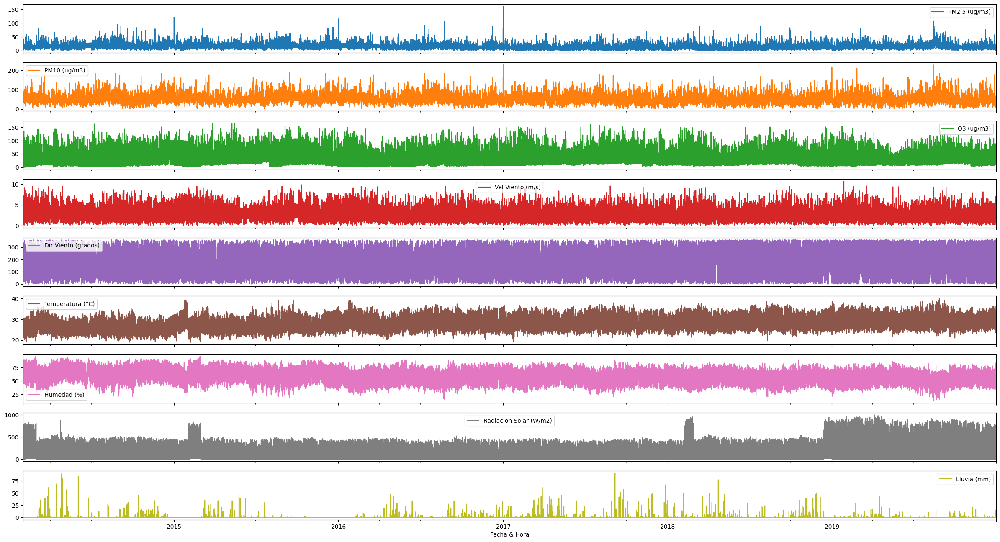

In [ ]:
cols = [
    "PM2.5 (ug/m3)",
    "PM10 (ug/m3)",
    "O3 (ug/m3)",
    "Vel Viento (m/s)",
    "Dir Viento (grados)",
    "Temperatura (°C)",
    "Humedad (%)",
    "Radiacion Solar (W/m2)",
    "Lluvia (mm)"
]

df_plot = df_estación_compartir_clean.copy()

df_plot["Fecha & Hora"] = pd.to_datetime(
    df_plot["Fecha & Hora"]
)

df_plot = df_plot.set_index("Fecha & Hora")

plots = df_plot[cols]

_ = plots.plot(
    subplots=True,
    figsize=(30,16),
    sharex=True
)

In [ ]:
tabla_nulos = pd.DataFrame({
    'Nulos': (
        df_estación_compartir_clean
        .isnull()
        .sum()
    ),

    'Porcentaje (%)': (
        df_estación_compartir_clean
        .isnull()
        .mean() * 100
    ).round(2)
})

tabla_nulos

,Nulos,Porcentaje (%)
Fecha & Hora,0,0.0
PM10 (ug/m3),0,0.0
PM2.5 (ug/m3),0,0.0
O3 (ug/m3),0,0.0
Vel Viento (m/s),0,0.0
Dir Viento (grados),0,0.0
Temperatura (°C),0,0.0
Humedad (%),0,0.0
Radiacion Solar (W/m2),0,0.0
Lluvia (mm),0,0.0


In [ ]:
#df_estación_compartir_clean.to_excel(
#    "df_estación_compartir_clean.xlsx",
#    index=False
#)

#print("Excel exportado correctamente")

# **EDA DESPUÉS DE LIMPIEZA**

In [37]:
df_estación_compartir_clean = pd.read_excel( "df_estación_compartir_clean.xlsx")

In [38]:
df_estación_compartir_clean.columns

Index(['Fecha & Hora', 'PM10 (ug/m3)', 'PM2.5 (ug/m3)', 'O3 (ug/m3)',
       'Vel Viento (m/s)', 'Dir Viento (grados)', 'Temperatura (°C)',
       'Humedad (%)', 'Radiacion Solar (W/m2)', 'Lluvia (mm)'],
      dtype='object')

In [39]:
cols = [
    "PM10 (ug/m3)",
    "PM2.5 (ug/m3)",
    "O3 (ug/m3)",
    "Temperatura (°C)",
    "Humedad (%)",
    "Radiacion Solar (W/m2)",
    "Lluvia (mm)"
]

In [40]:
df_plot = df_estación_compartir_clean.copy()

df_plot["Fecha & Hora"] = pd.to_datetime(
    df_plot["Fecha & Hora"]
)

df_plot = df_plot.set_index("Fecha & Hora")


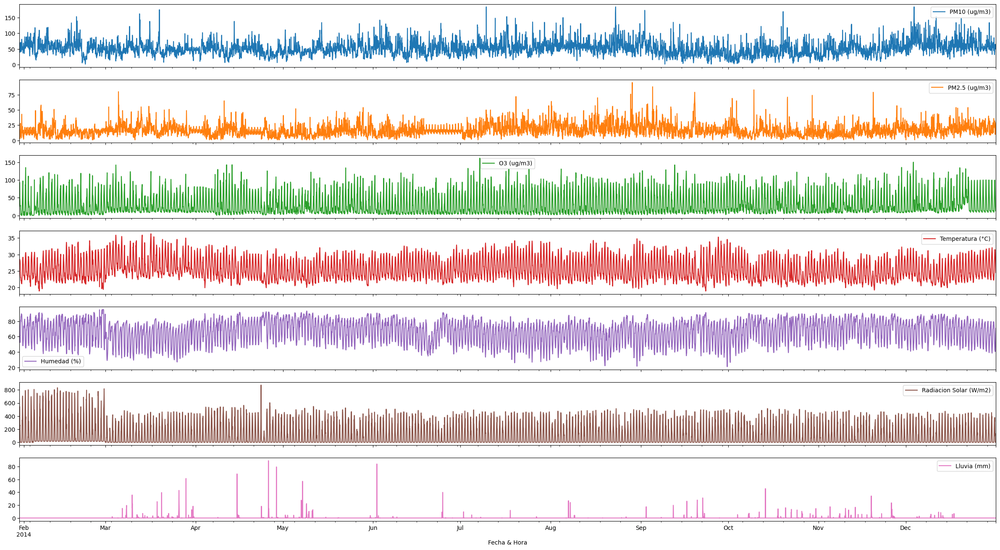

In [ ]:
df_2014 = df_plot.loc["2014"]

_ = df_2014[cols].plot(
    subplots=True,
    figsize=(30,16),
    sharex=True
)

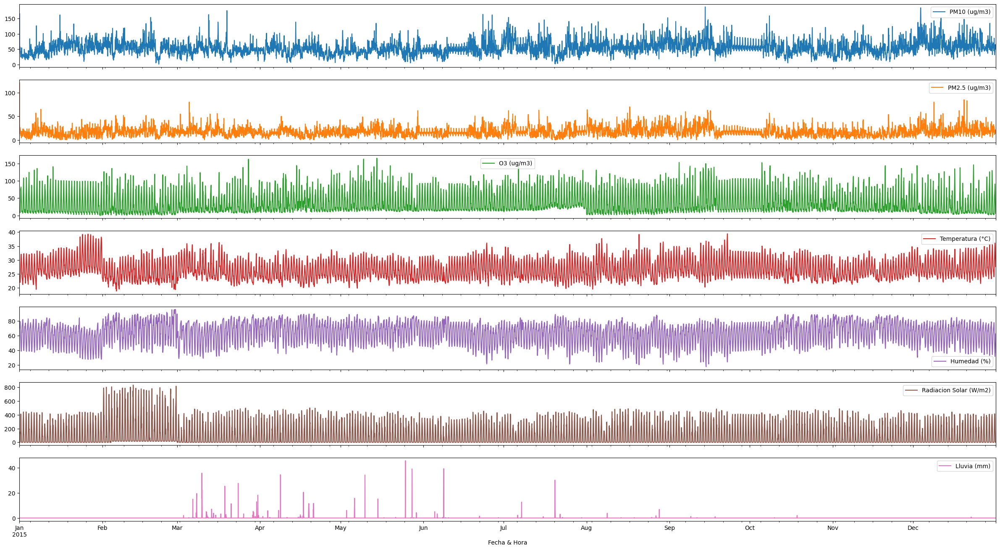

In [ ]:
df_2015 = df_plot.loc["2015"]

_ = df_2015[cols].plot(
    subplots=True,
    figsize=(30,16),
    sharex=True
)

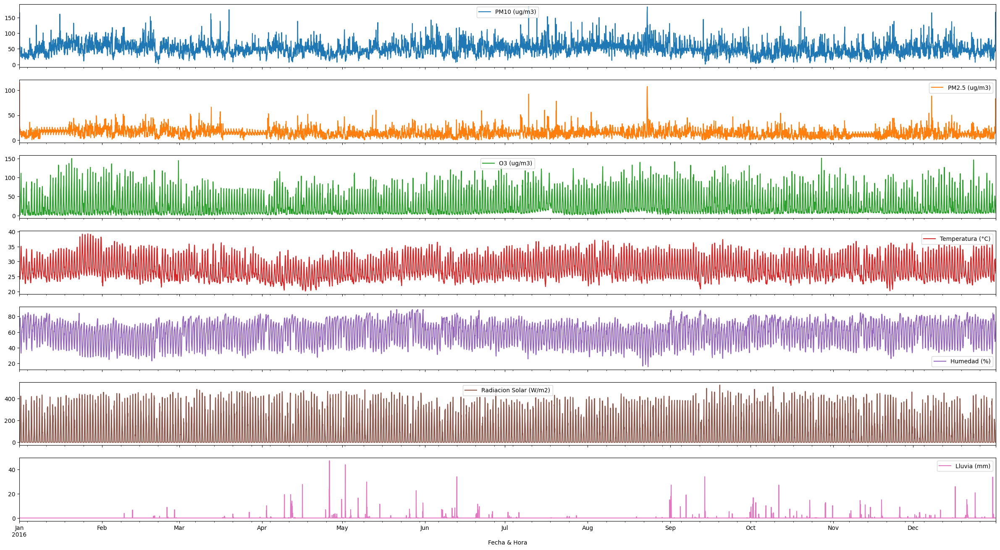

In [ ]:
df_2016 = df_plot.loc["2016"]

_ = df_2016[cols].plot(
    subplots=True,
    figsize=(30,16),
    sharex=True
)

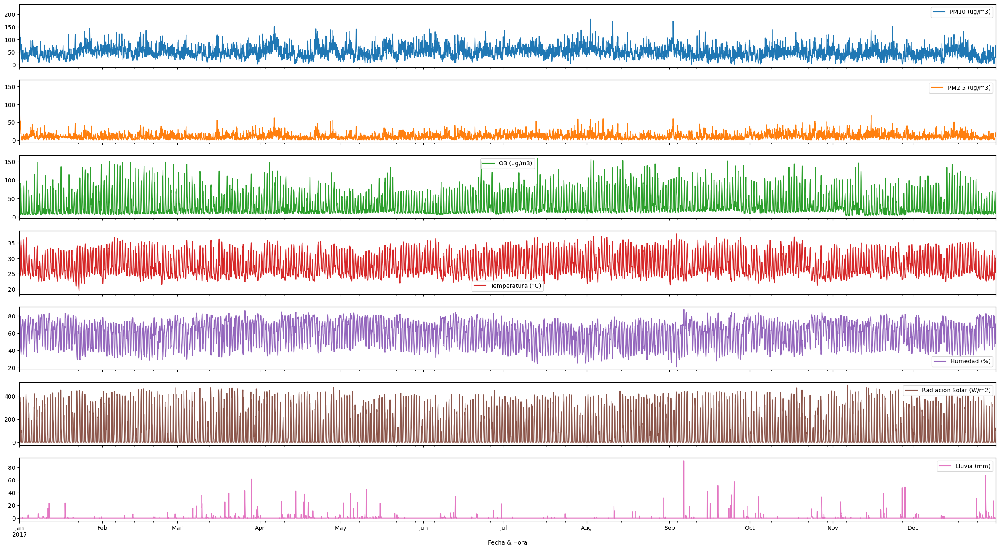

In [ ]:
df_2017 = df_plot.loc["2017"]

_ = df_2017[cols].plot(
    subplots=True,
    figsize=(30,16),
    sharex=True
)

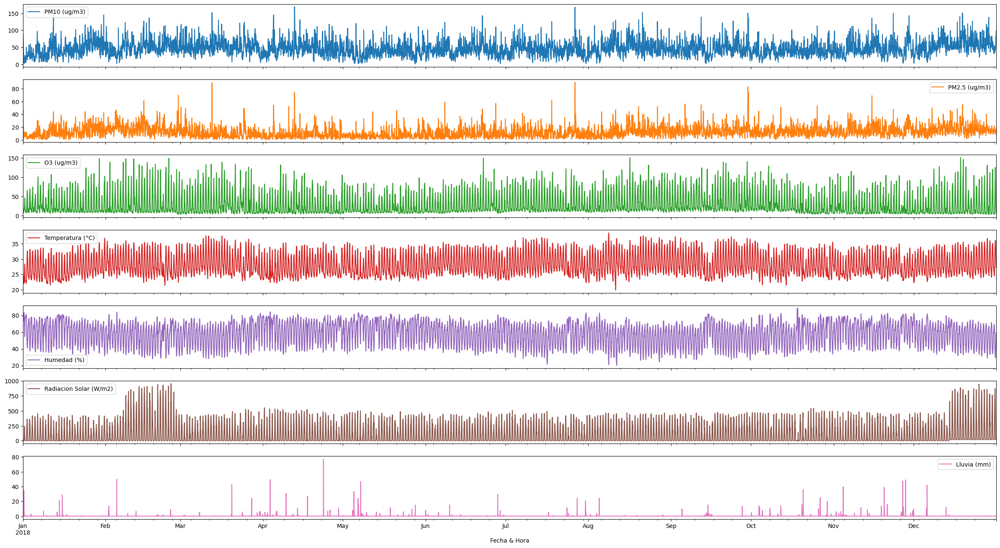

In [ ]:
df_2018 = df_plot.loc["2018"]

_ = df_2018[cols].plot(
    subplots=True,
    figsize=(30,16),
    sharex=True
)

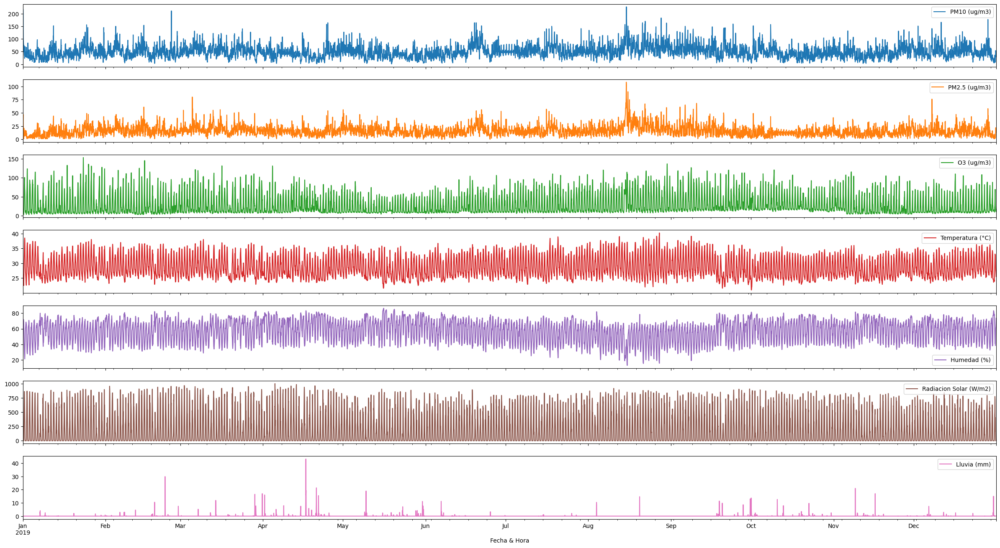

In [ ]:
df_2019 = df_plot.loc["2019"]

_ = df_2019[cols].plot(
    subplots=True,
    figsize=(30,16),
    sharex=True
)

In [ ]:
df_estación_compartir_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51877 entries, 0 to 51876
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Fecha & Hora            51877 non-null  datetime64[ns]
 1   PM10 (ug/m3)            51877 non-null  float64       
 2   PM2.5 (ug/m3)           51877 non-null  float64       
 3   O3 (ug/m3)              51877 non-null  float64       
 4   Vel Viento (m/s)        51877 non-null  float64       
 5   Dir Viento (grados)     51877 non-null  float64       
 6   Temperatura (°C)        51877 non-null  float64       
 7   Humedad (%)             51877 non-null  float64       
 8   Radiacion Solar (W/m2)  51877 non-null  float64       
 9   Lluvia (mm)             51877 non-null  float64       
dtypes: datetime64[ns](1), float64(9)
memory usage: 4.0 MB


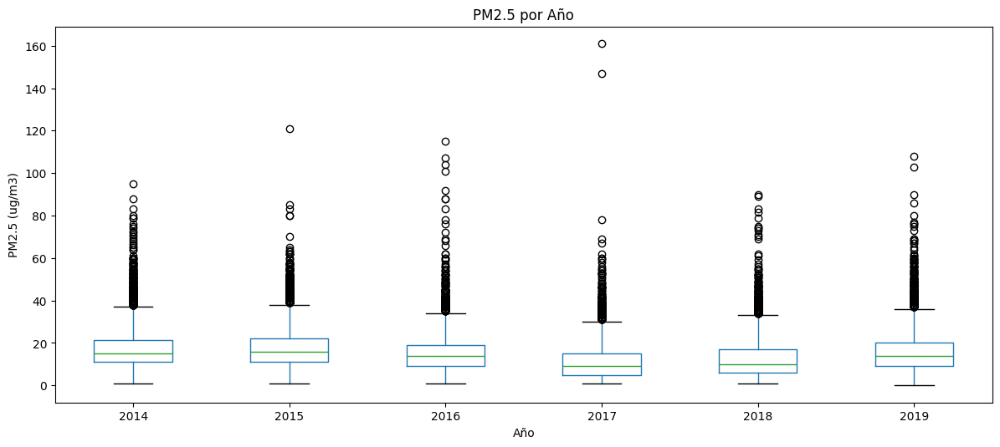

In [ ]:
df_plot = df_estación_compartir_clean.copy()

# Poner fecha como índice
df_plot = df_plot.set_index("Fecha & Hora")

# Crear columna año
df_plot["Año"] = df_plot.index.year

# Boxplot PM2.5 por año
_ = df_plot.boxplot(
    column="PM2.5 (ug/m3)",
    by="Año",
    figsize=(14,6),
    grid=False
)

plt.title("PM2.5 por Año")
plt.suptitle("")

plt.xlabel("Año")
plt.ylabel("PM2.5 (ug/m3)")

plt.show()

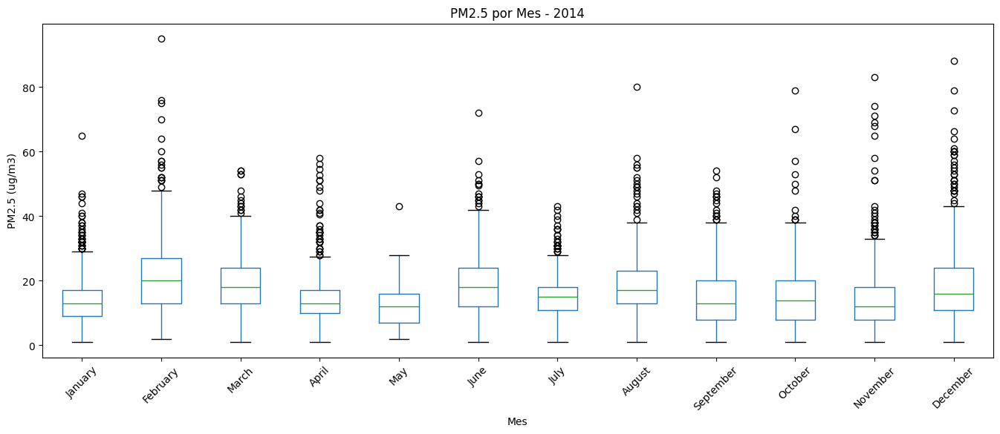

In [ ]:
df_plot = df_estación_compartir_clean.copy()

# Índice de fecha
df_plot = df_plot.set_index("Fecha & Hora")

# Filtrar 2014
df_2014 = df_plot.loc["2014"].copy()

# Crear columna con nombre del mes
df_2014["Mes"] = df_2014.index.month_name()

# Orden correcto de meses
orden_meses = list(calendar.month_name)[1:]

# Boxplot
_ = df_2014.boxplot(
    column="PM2.5 (ug/m3)",
    by="Mes",
    figsize=(16,6),
    grid=False
)

plt.title("PM2.5 por Mes - 2014")
plt.suptitle("")

plt.xlabel("Mes")
plt.ylabel("PM2.5 (ug/m3)")

# Ordenar meses
plt.xticks(
    range(1,13),
    orden_meses,
    rotation=45
)

plt.show()

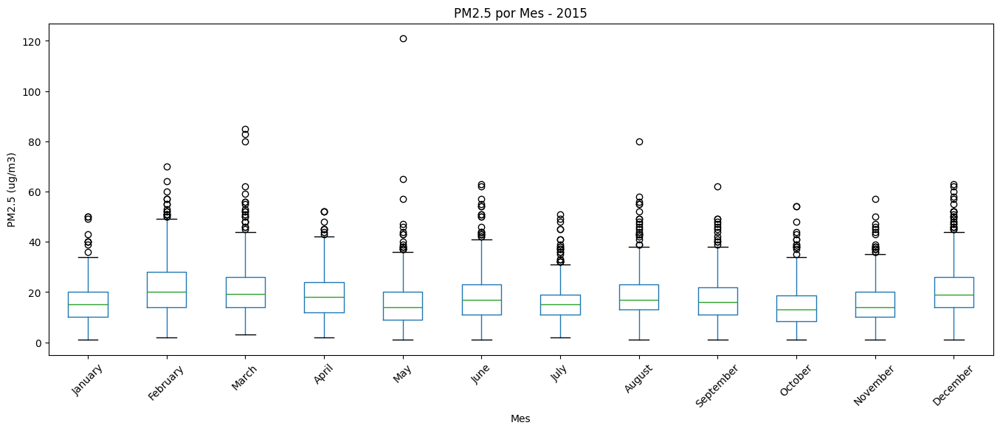

In [ ]:
df_plot = df_estación_compartir_clean.copy()

# Índice de fecha
df_plot = df_plot.set_index("Fecha & Hora")

# Filtrar 2015
df_2015 = df_plot.loc["2015"].copy()

# Crear columna con nombre del mes
df_2015["Mes"] = df_2015.index.month_name()

# Orden correcto de meses
orden_meses = list(calendar.month_name)[1:]

# Boxplot
_ = df_2015.boxplot(
    column="PM2.5 (ug/m3)",
    by="Mes",
    figsize=(16,6),
    grid=False
)

plt.title("PM2.5 por Mes - 2015")
plt.suptitle("")

plt.xlabel("Mes")
plt.ylabel("PM2.5 (ug/m3)")

# Ordenar meses
plt.xticks(
    range(1,13),
    orden_meses,
    rotation=45
)

plt.show()

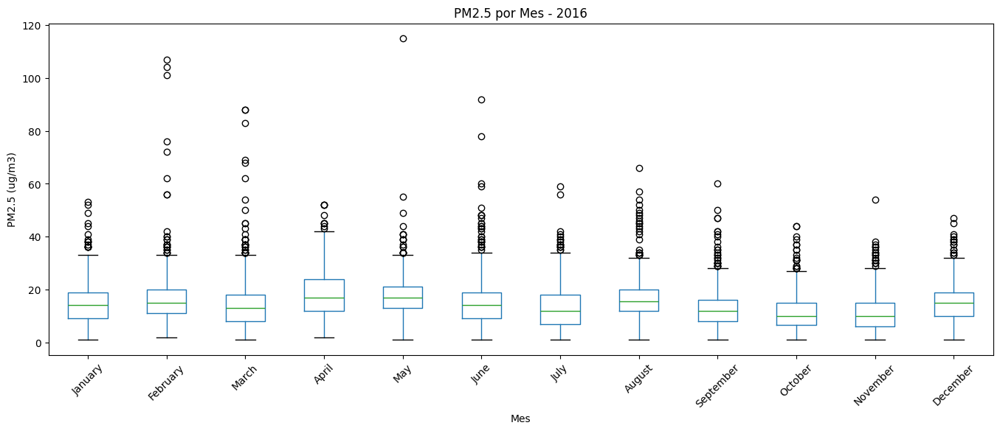

In [ ]:
df_plot = df_estación_compartir_clean.copy()

# Índice de fecha
df_plot = df_plot.set_index("Fecha & Hora")

# Filtrar 2016
df_2016 = df_plot.loc["2016"].copy()

# Crear columna con nombre del mes
df_2016["Mes"] = df_2016.index.month_name()

# Orden correcto de meses
orden_meses = list(calendar.month_name)[1:]

# Boxplot
_ = df_2016.boxplot(
    column="PM2.5 (ug/m3)",
    by="Mes",
    figsize=(16,6),
    grid=False
)

plt.title("PM2.5 por Mes - 2016")
plt.suptitle("")

plt.xlabel("Mes")
plt.ylabel("PM2.5 (ug/m3)")

# Ordenar meses
plt.xticks(
    range(1,13),
    orden_meses,
    rotation=45
)

plt.show()

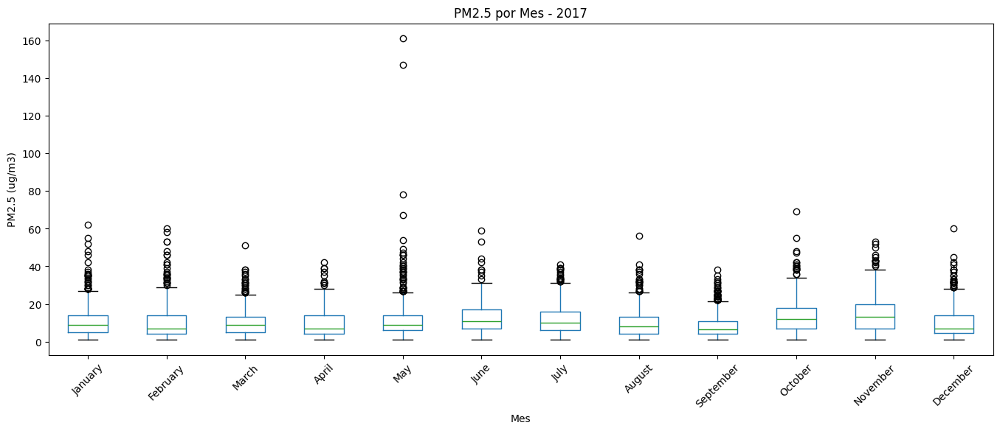

In [ ]:
df_plot = df_estación_compartir_clean.copy()

# Índice de fecha
df_plot = df_plot.set_index("Fecha & Hora")

# Filtrar 2017
df_2017 = df_plot.loc["2017"].copy()

# Crear columna con nombre del mes
df_2017["Mes"] = df_2017.index.month_name()

# Orden correcto de meses
orden_meses = list(calendar.month_name)[1:]

# Boxplot
_ = df_2017.boxplot(
    column="PM2.5 (ug/m3)",
    by="Mes",
    figsize=(16,6),
    grid=False
)

plt.title("PM2.5 por Mes - 2017")
plt.suptitle("")

plt.xlabel("Mes")
plt.ylabel("PM2.5 (ug/m3)")

# Ordenar meses
plt.xticks(
    range(1,13),
    orden_meses,
    rotation=45
)

plt.show()

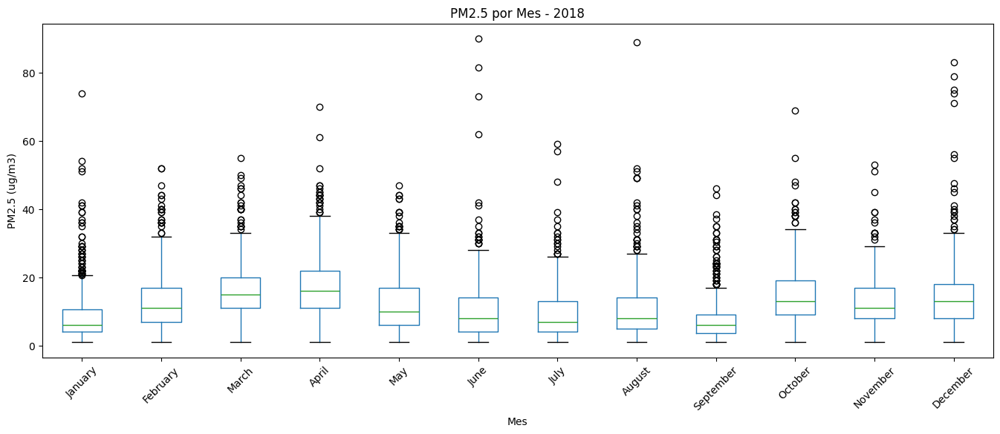

In [ ]:
df_plot = df_estación_compartir_clean.copy()

# Índice de fecha
df_plot = df_plot.set_index("Fecha & Hora")

# Filtrar 2018
df_2018 = df_plot.loc["2018"].copy()

# Crear columna con nombre del mes
df_2018["Mes"] = df_2018.index.month_name()

# Orden correcto de meses
orden_meses = list(calendar.month_name)[1:]

# Boxplot
_ = df_2018.boxplot(
    column="PM2.5 (ug/m3)",
    by="Mes",
    figsize=(16,6),
    grid=False
)

plt.title("PM2.5 por Mes - 2018")
plt.suptitle("")

plt.xlabel("Mes")
plt.ylabel("PM2.5 (ug/m3)")

# Ordenar meses
plt.xticks(
    range(1,13),
    orden_meses,
    rotation=45
)

plt.show()

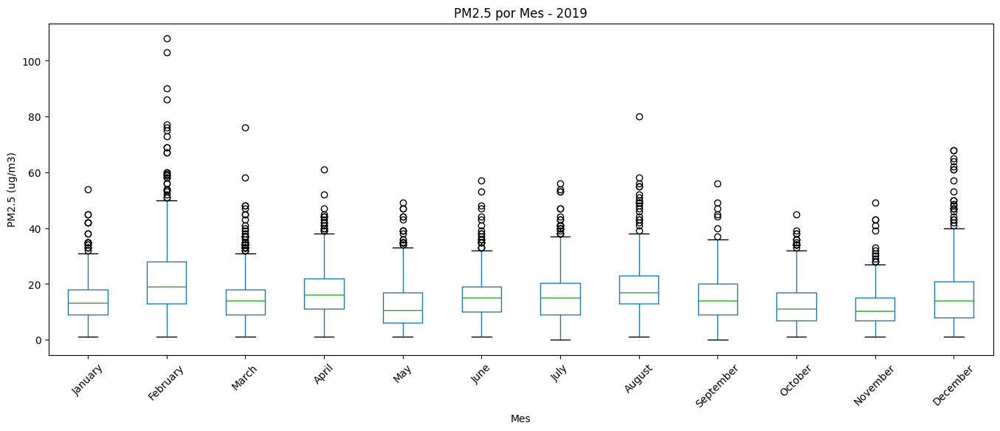

In [ ]:
df_plot = df_estación_compartir_clean.copy()

# Índice de fecha
df_plot = df_plot.set_index("Fecha & Hora")

# Filtrar 2019
df_2019 = df_plot.loc["2019"].copy()

# Crear columna con nombre del mes
df_2019["Mes"] = df_2019.index.month_name()

# Orden correcto de meses
orden_meses = list(calendar.month_name)[1:]

# Boxplot
_ = df_2019.boxplot(
    column="PM2.5 (ug/m3)",
    by="Mes",
    figsize=(16,6),
    grid=False
)

plt.title("PM2.5 por Mes - 2019")
plt.suptitle("")

plt.xlabel("Mes")
plt.ylabel("PM2.5 (ug/m3)")

# Ordenar meses
plt.xticks(
    range(1,13),
    orden_meses,
    rotation=45
)

plt.show()

# **CORRELACIONES**

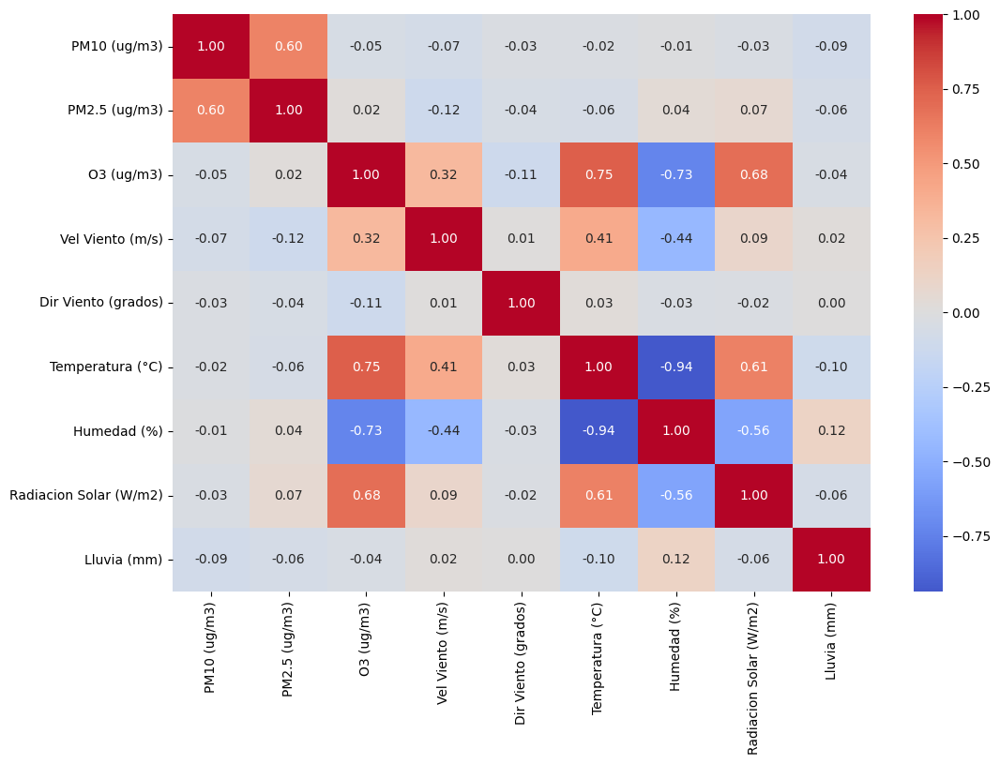

In [42]:
plt.figure(figsize=(12,8))

sns.heatmap(
    df_estación_compartir_clean.corr(numeric_only=True),
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0
)

plt.show()

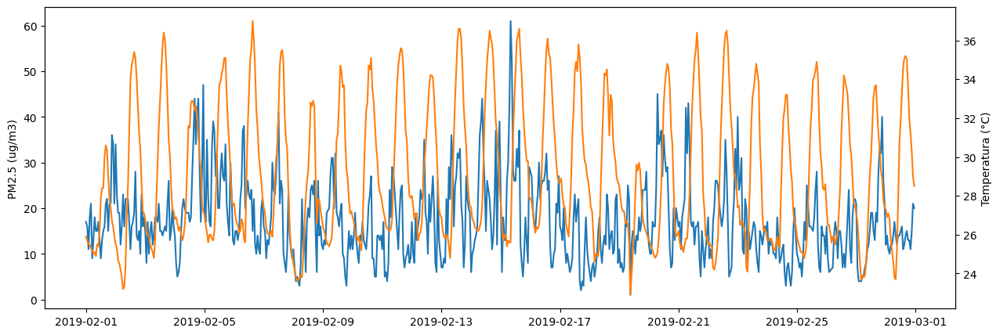

In [49]:
# Febrero de 2019
df_feb2019 = df_estación_compartir_clean[
    (df_estación_compartir_clean["Fecha & Hora"].dt.year == 2019) &
    (df_estación_compartir_clean["Fecha & Hora"].dt.month == 2)
]

fig, ax1 = plt.subplots(figsize=(15,5))

ax1.plot(
    df_feb2019["Fecha & Hora"],
    df_feb2019["PM2.5 (ug/m3)"],
    label="PM2.5 (ug/m3)",
    color="tab:blue"
)
ax1.set_ylabel("PM2.5 (ug/m3)")

ax2 = ax1.twinx()

ax2.plot(
    df_feb2019["Fecha & Hora"],
    df_feb2019["Temperatura (°C)"],
    label="Temperatura (°C)",
    color="tab:orange"
)
ax2.set_ylabel("Temperatura (°C)")

plt.show()

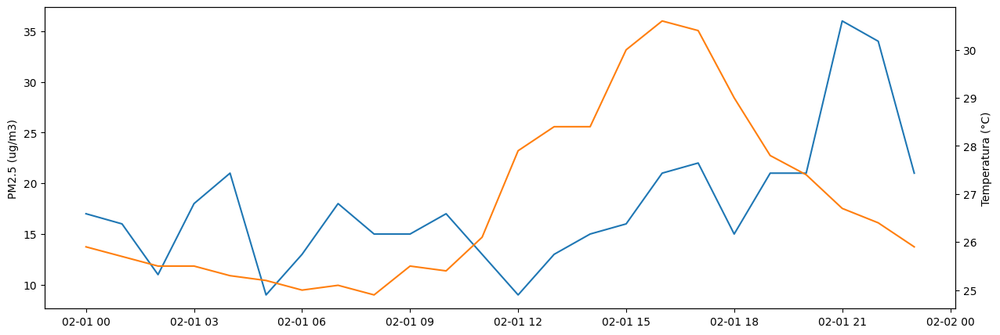

In [57]:
df_dia = df_estación_compartir_clean[
    (df_estación_compartir_clean["Fecha & Hora"].dt.year == 2019) &
    (df_estación_compartir_clean["Fecha & Hora"].dt.month == 2) &
    (df_estación_compartir_clean["Fecha & Hora"].dt.day == 1)
]

fig, ax1 = plt.subplots(figsize=(15,5))

ax1.plot(
    df_dia["Fecha & Hora"],
    df_dia["PM2.5 (ug/m3)"],
    color="tab:blue"
)
ax1.set_ylabel("PM2.5 (ug/m3)")

ax2 = ax1.twinx()

ax2.plot(
    df_dia["Fecha & Hora"],
    df_dia["Temperatura (°C)"],
    color="tab:orange"
)
ax2.set_ylabel("Temperatura (°C)")

plt.show()

# **FEATURE ENGINEERING**

In [ ]:
df_estación_compartir_clean.head(10)

,Fecha & Hora,PM10 (ug/m3),PM2.5 (ug/m3),O3 (ug/m3),Vel Viento (m/s),Dir Viento (grados),Temperatura (°C),Humedad (%),Radiacion Solar (W/m2),Lluvia (mm)
0,2014-01-30 11:00:00,75.0,19.0,61.40,3.20,75.5,27.1,61.9,659.85,0.0
1,2014-01-30 12:00:00,55.0,17.0,69.04,1.90,107.6,27.1,61.9,501.40,0.0
2,2014-01-30 13:00:00,47.0,15.0,93.19,0.50,105.2,27.4,59.9,326.60,0.0
3,2014-01-30 14:00:00,55.0,7.0,85.03,2.50,90.9,28.5,54.1,541.00,0.0
4,2014-01-30 15:00:00,70.0,4.0,52.98,3.50,73.2,28.4,56.4,248.80,0.0
5,2014-01-30 16:00:00,54.0,3.0,42.37,4.60,342.1,28.1,52.5,262.10,0.0
6,2014-01-30 17:00:00,40.0,8.0,26.20,5.95,294.7,27.9,52.4,129.00,0.0
7,2014-01-30 18:00:00,41.0,13.0,26.63,7.30,287.7,27.1,53.2,42.40,0.0
8,2014-01-30 19:00:00,56.0,7.0,26.26,2.10,327.5,24.2,74.0,0.00,0.0
9,2014-01-30 20:00:00,57.0,28.0,28.34,3.00,99.8,23.6,78.2,0.00,0.0


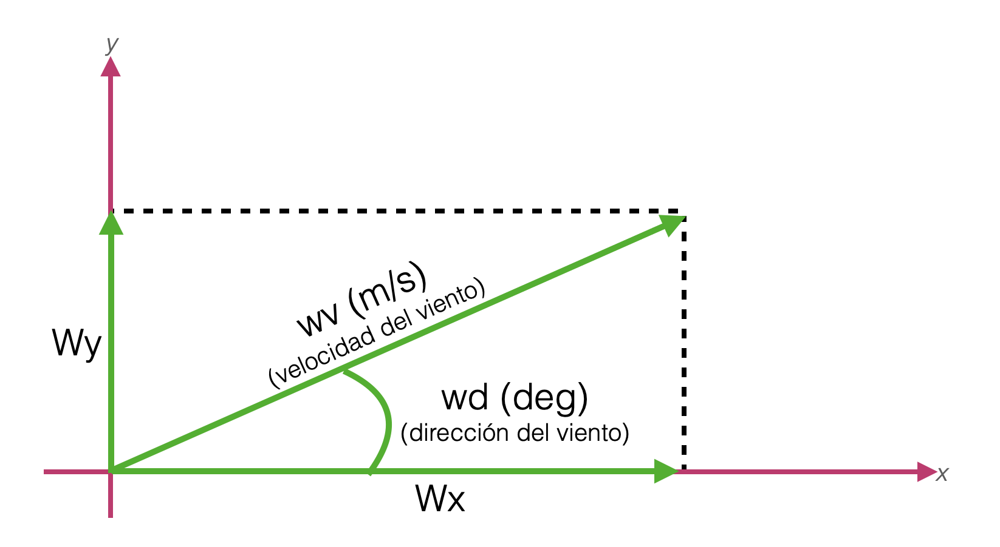

In [ ]:
Image('/content/i1.png')

In [ ]:
# =============================
# FEATURE ENGINEERING (VIENTO)
# =============================

# Convertir dirección del viento a radianes
w_dir = df_estación_compartir_clean["Dir Viento (grados)"] * np.pi / 180

# Componentes del viento
Wx = (
    df_estación_compartir_clean["Vel Viento (m/s)"]
    * np.cos(w_dir)
)

Wy = (
    df_estación_compartir_clean["Vel Viento (m/s)"]
    * np.sin(w_dir)
)

# =============================
# ELIMINAR COLUMNAS ORIGINALES
# =============================

df_estación_compartir_clean.pop("Dir Viento (grados)")
df_estación_compartir_clean.pop("Vel Viento (m/s)")

# =============================
# AGREGAR NUEVAS VARIABLES
# =============================

df_estación_compartir_clean["Wx"] = Wx
df_estación_compartir_clean["Wy"] = Wy

# Ver resultado
df_estación_compartir_clean.head()

,Fecha & Hora,PM10 (ug/m3),PM2.5 (ug/m3),O3 (ug/m3),Temperatura (°C),Humedad (%),Radiacion Solar (W/m2),Lluvia (mm),Wx,Wy
0,2014-01-30 11:00:00,75.0,19.0,61.40,27.1,61.9,659.85,0.0,0.801216,3.098072
1,2014-01-30 12:00:00,55.0,17.0,69.04,27.1,61.9,501.40,0.0,-0.574503,1.811062
2,2014-01-30 13:00:00,47.0,15.0,93.19,27.4,59.9,326.60,0.0,-0.131095,0.482508
3,2014-01-30 14:00:00,55.0,7.0,85.03,28.5,54.1,541.00,0.0,-0.039268,2.499692
4,2014-01-30 15:00:00,70.0,4.0,52.98,28.4,56.4,248.80,0.0,1.011611,3.350618


# **ANÁLISIS DETALLADO DE LA VARIABLE TIEMPO**

In [ ]:
print(df_estación_compartir_clean["Fecha & Hora"][0])
print(df_estación_compartir_clean["Fecha & Hora"].iloc[-1])
print(
    pd.to_datetime(df_estación_compartir_clean["Fecha & Hora"].iloc[-1])
    -
    pd.to_datetime(df_estación_compartir_clean["Fecha & Hora"][0])
)

2014-01-30 11:00:00
2019-12-31 23:00:00
2161 days 12:00:00


In [ ]:
pd.infer_freq(
    pd.to_datetime(df_estación_compartir_clean["Fecha & Hora"])
)

'h'

**La pregunta es entonces, ¿cómo sabemos cuáles de estas variables temporales son relevantes al momento de predecir la temperatura?**

* Una manera de lograr esto es usando la **Transformada de Fourier**, una herramienta matemática que nos permite conocer los componentes en frecuencia de una señal.

* Los componentes en frecuencia son aquellos elementos de la señal que se repiten con una cierta periodicidad (cada cierto tiempo) y eso es lo que nos interesa encontrar en nuestra señal.

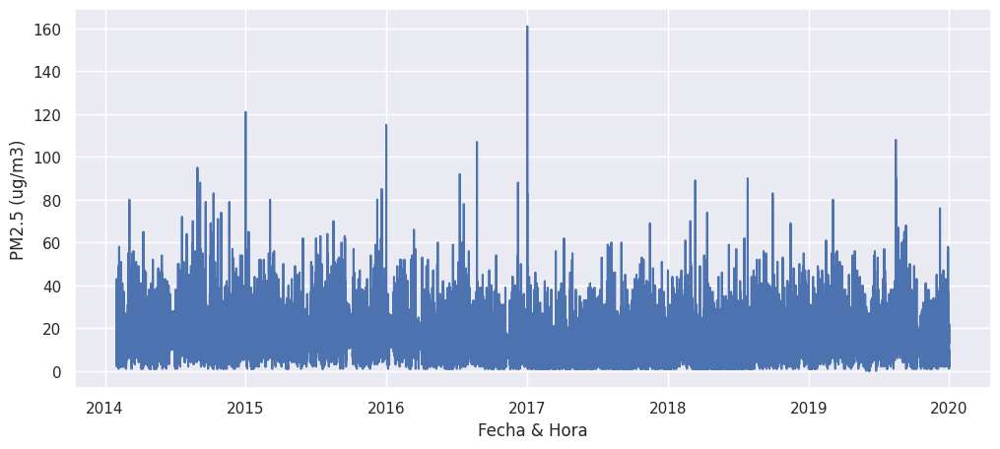

In [ ]:
sns.set()

# Extraer PM2.5
pm25 = df_estación_compartir_clean['PM2.5 (ug/m3)']

# Y graficarla
fig, ax = plt.subplots(figsize=(12,5))

sns.lineplot(
    x=df_estación_compartir_clean["Fecha & Hora"],
    y=pm25,
    ax=ax
);

In [ ]:
# 0. Parámetros de la serie de tiempo

pm25 = df_estación_compartir_clean['PM2.5 (ug/m3)']

pm25 = pm25 - pm25.mean()  #centramos la señal


N = len(pm25)          # Cantidad de muestras
muestras_hora = 1      # 1 muestra por hora

# 1. Calcular magnitud de la Transformada de Fourier

tf = np.abs(np.fft.rfft(pm25, N))

# 2. Calcular vector de frecuencias

frecs = np.fft.rfftfreq(N, d=1./muestras_hora)

# 3. Graficar

fig = px.line(
    x=frecs,
    y=tf,
    log_x=True
)

fig.update_layout(
    xaxis_title='Frecuencia (1/H)',
    yaxis_title='Magnitud'
)

fig.show()

**frecuencias dominantes**

ciclos que se repiten mucho en la serie temporal

In [ ]:
# Encontrar picos
picos, _ = find_peaks(
    tf,
    prominence=10000
)

# Ordenar por magnitud de mayor a menor
picos = picos[np.argsort(tf[picos])[::-1]]

print("Frecuencias dominantes encontradas en los picos del espectro:\n")

for i in picos[:10]:

    print(f"{frecs[i]:.8f} [1/H]")

Frecuencias dominantes encontradas en los picos del espectro:

0.00001928 [1/H]
0.08333173 [1/H]
0.04165623 [1/H]
0.00023132 [1/H]
0.12500723 [1/H]
0.16666345 [1/H]
0.00595640 [1/H]
0.00046263 [1/H]
0.00007711 [1/H]
0.00042408 [1/H]


In [ ]:
# Frecuencias encontradas

frec1 = 0.00001928
frec2 = 0.08333173
frec3 = 0.04165623
frec4 = 0.00023132
frec5 = 0.12500723
frec6 = 0.16666345
frec7 = 0.00595640
frec8 = 0.00046263
frec9 = 0.00007711
frec10 = 0.00042408

print(f'La frecuencia {frec1} equivale a {1/frec1} horas')
print(f'La frecuencia {frec2} equivale a {1/frec2} horas')
print(f'La frecuencia {frec3} equivale a {1/frec3} horas')
print(f'La frecuencia {frec4} equivale a {1/frec4} horas')
print(f'La frecuencia {frec5} equivale a {1/frec5} horas')

La frecuencia 1.928e-05 equivale a 51867.21991701245 horas
La frecuencia 0.08333173 equivale a 12.000230884442216 horas
La frecuencia 0.04165623 equivale a 24.006013026142785 horas
La frecuencia 0.00023132 equivale a 4323.015735777278 horas
La frecuencia 0.12500723 equivale a 7.999537306762177 horas


Frecuencia (1/H)	Período

51867 h	 ≈ 5.9 años

12 h	 -->      medio día

24 h	 -->      1 día

4323 h	   ≈ 180 días (semestre)

8 h	  -->     tercio de día

**Conclusión**

cada registro tiene su marca de tiempo, revisando la periosidad que tiene la varibales PM2.5 con respecto al tiempo vimos algos picos relevantes en freciecia, que equivalen principalmente a día, medio día, tercio de día (posibles patrones de actividad humana), semestre (tiene que ver con estaciones o temporadas), sin emabargo 6 años no nos sirve porque es un tendencia de muy largo plazo que es practicamente el equivalente a todo nuestro dataset.


Para nuestra variable PM2.5 las varibales temporales más relevantes son, el día, hora y mes

# **CODIFICACIÓN DE VARIABLES TEMPORALES**

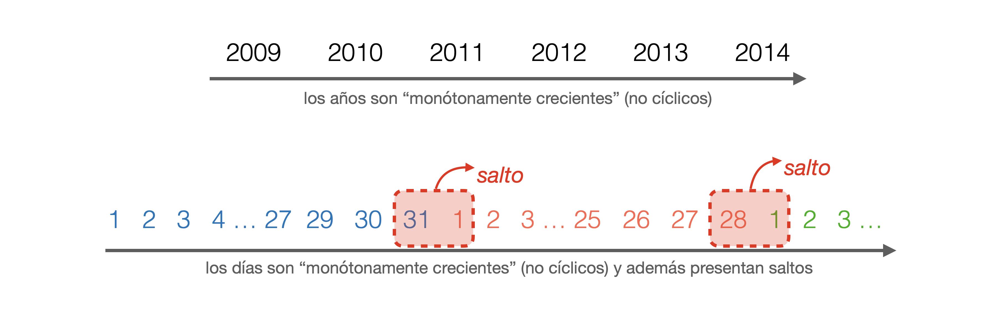

In [ ]:
Image('/content/I2.png')

Esta representación dificulta al modelo LSTM encontrar patrones que relacionen las variables temporales con PM2.5.

Una solución usada comúnmente en estos casos es representar las variables temporales con senos y cosenos, con esto:

1. Se añade a la variable temporal un comportamiento cíclico (si no tiene)

2. No habrá saltos


In [ ]:
df_estación_compartir_clean.head()

,Fecha & Hora,PM10 (ug/m3),PM2.5 (ug/m3),O3 (ug/m3),Temperatura (°C),Humedad (%),Radiacion Solar (W/m2),Lluvia (mm),Wx,Wy
0,2014-01-30 11:00:00,75.0,19.0,61.40,27.1,61.9,659.85,0.0,0.801216,3.098072
1,2014-01-30 12:00:00,55.0,17.0,69.04,27.1,61.9,501.40,0.0,-0.574503,1.811062
2,2014-01-30 13:00:00,47.0,15.0,93.19,27.4,59.9,326.60,0.0,-0.131095,0.482508
3,2014-01-30 14:00:00,55.0,7.0,85.03,28.5,54.1,541.00,0.0,-0.039268,2.499692
4,2014-01-30 15:00:00,70.0,4.0,52.98,28.4,56.4,248.80,0.0,1.011611,3.350618


In [ ]:
# Codificar cada combinación AAAA-MM-DD HH:MM:SS a su representación en segundos

tiempo_s = pd.to_datetime(
    df_estación_compartir_clean["Fecha & Hora"]
).map(pd.Timestamp.timestamp)

tiempo_s

,Fecha & Hora
0,1.391080e+09
1,1.391083e+09
2,1.391087e+09
3,1.391090e+09
4,1.391094e+09
...,...
51872,1.577819e+09
51873,1.577822e+09
51874,1.577826e+09
51875,1.577830e+09


In [ ]:
# Por ejemplo, entre dos instantes de tiempo consecutivos
# habrá exactamente 3.600 segundos = 1 hora!

tiempo_s[2] - tiempo_s[1]

np.float64(3600.0)

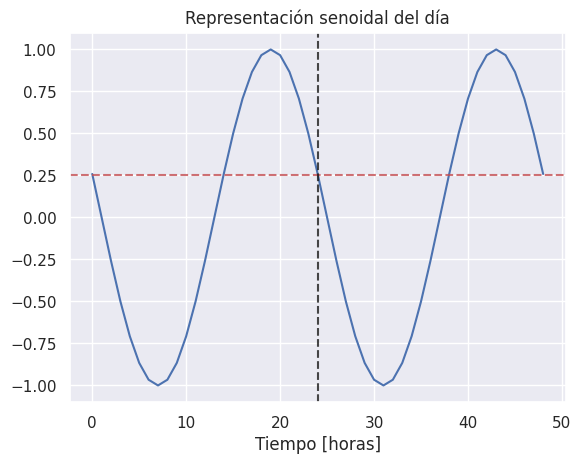

In [ ]:
# Definir 1 día en segundos como 24 horas x 60 min x 60 s
dia = 24 * 60 * 60

# Representar el día senoidalmente
# La frecuencia de la función será 1/día
dia_sin = np.sin(tiempo_s * (2 * np.pi / dia))

# Graficar 2 días (48 horas)
fig, ax = plt.subplots()

plt.plot(np.array(dia_sin)[:49])

plt.xlabel('Tiempo [horas]')
plt.title('Representación senoidal del día')

# Dibujar línea horizontal en y = 0.25
ax.axhline(0.25, color='r', linestyle='--', alpha=0.8)

# Dibujar línea vertical en 24 horas
ax.axvline(24, color='k', linestyle='--', alpha=0.8);

Vemos que:

1. No hay saltos
2. Hay periodicidad: la hora 0 equivale a la hora 24, la hora 1 a la hora 25, etc.
3. Varias horas son codificadas con el mismo valor. Ejemplo: 0h, 10h, 24h son codificadas con 0.25

Para resolver el problema anterior se puede usar tanto representación senoidal como cosenoidal:

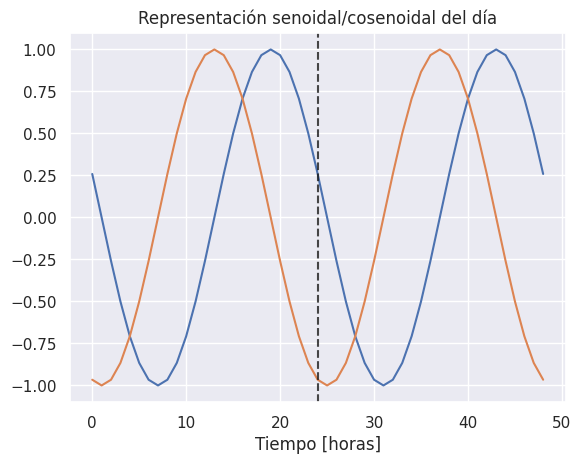

In [ ]:
# Representar la hora con senos y cosenos

dia_sin = np.sin(tiempo_s * (2 * np.pi / dia))
dia_cos = np.cos(tiempo_s * (2 * np.pi / dia))

# Graficar 2 días (48 horas)

fig, ax = plt.subplots()

plt.plot(np.array(dia_sin)[:49])
plt.plot(np.array(dia_cos)[:49])

plt.xlabel('Tiempo [horas]')
plt.title('Representación senoidal/cosenoidal del día')

# Dibujar línea vertical en 24 horas
ax.axvline(24, color='k', linestyle='--', alpha=0.8);

Así:

> Con la codificación senoidal y cosenoidal cada instante de tiempo es codificado con un valor único.

Teniendo esto claro, ahora sí podemos codificar las variables temporales


Es importante observar que:

> No es necesario combinar días (seno y coseno) y años (seno y coseno) en una misma variable. Durante el entrenamiento el modelo LSTM aprenderá a ponderarlas de la manera más adecuada.


In [ ]:
# Representar el día con senos y cosenos (ciclo de 24 horas)

df_estación_compartir_clean['dia_sin'] = np.sin(tiempo_s * (2 * np.pi / dia))

df_estación_compartir_clean['dia_cos'] = np.cos(tiempo_s * (2 * np.pi / dia))


# Ciclo de 12 horas (medio día)

medio_dia = dia / 2

df_estación_compartir_clean['medio_dia_sin'] = np.sin(tiempo_s * (2 * np.pi / medio_dia))

df_estación_compartir_clean['medio_dia_cos'] = np.cos(tiempo_s * (2 * np.pi / medio_dia))


# Ciclo de 8 horas (tercio de día)

tercio_dia = dia / 3

df_estación_compartir_clean['tercio_dia_sin'] = np.sin(tiempo_s * (2 * np.pi / tercio_dia))

df_estación_compartir_clean['tercio_dia_cos'] = np.cos(tiempo_s * (2 * np.pi / tercio_dia))



# Ciclo semestral (~6 meses)

semestre = 182.5 * dia

df_estación_compartir_clean['semestre_sin'] = np.sin(tiempo_s * (2 * np.pi / semestre))

df_estación_compartir_clean['semestre_cos'] = np.cos(tiempo_s * (2 * np.pi / semestre))

In [ ]:
df_estación_compartir_clean["Año"] = (
    df_estación_compartir_clean["Fecha & Hora"].dt.year
)

df_estación_compartir_clean["Mes"] = (
    df_estación_compartir_clean["Fecha & Hora"].dt.month
)

df_estación_compartir_clean["Día"] = (
    df_estación_compartir_clean["Fecha & Hora"].dt.day
)

df_estación_compartir_clean["Hora"] = (
    df_estación_compartir_clean["Fecha & Hora"].dt.hour
)

In [ ]:
df_estación_compartir_clean = df_estación_compartir_clean.drop(columns=["Fecha & Hora"])

In [ ]:
df_estación_compartir_clean.head()

,PM10 (ug/m3),PM2.5 (ug/m3),O3 (ug/m3),Temperatura (°C),Humedad (%),Radiacion Solar (W/m2),Lluvia (mm),Wx,Wy,dia_sin,...,medio_dia_sin,medio_dia_cos,tercio_dia_sin,tercio_dia_cos,semestre_sin,semestre_cos,Año,Mes,Día,Hora
0,75.0,19.0,61.40,27.1,61.9,659.85,0.0,0.801216,3.098072,2.588190e-01,...,-5.000000e-01,8.660254e-01,7.071068e-01,-7.071068e-01,0.984221,0.176944,2014,1,30,11
1,55.0,17.0,69.04,27.1,61.9,501.40,0.0,-0.574503,1.811062,7.563700e-12,...,-1.512740e-11,1.000000e+00,2.269110e-11,-1.000000e+00,0.984474,0.175531,2014,1,30,12
2,47.0,15.0,93.19,27.4,59.9,326.60,0.0,-0.131095,0.482508,-2.588190e-01,...,5.000000e-01,8.660254e-01,-7.071068e-01,-7.071068e-01,0.984725,0.174119,2014,1,30,13
3,55.0,7.0,85.03,28.5,54.1,541.00,0.0,-0.039268,2.499692,-5.000000e-01,...,8.660254e-01,5.000000e-01,-1.000000e+00,-2.525445e-11,0.984973,0.172706,2014,1,30,14
4,70.0,4.0,52.98,28.4,56.4,248.80,0.0,1.011611,3.350618,-7.071068e-01,...,1.000000e+00,1.769074e-11,-7.071068e-01,7.071068e-01,0.985220,0.171293,2014,1,30,15


In [ ]:
# df_estación_compartir_clean.to_excel("df_estación_compartir_clean2.xlsx",index=False)

In [4]:
df_estación_compartir_clean2 = pd.read_excel( "df_estación_compartir_clean2.xlsx")

# **PRE PROCESAMIENTO**

Implica:

Partición en train/val/test (80%, 10%, 10%).

Generación del dataset supervisado: entrada y salida del modelo

Escalamiento

Train	--> entrenar el modelo

Validation --> ajustar hiperparámetros

Test --> evaluación final REAL

In [5]:
df_estación_compartir_clean2.head()

,PM10 (ug/m3),PM2.5 (ug/m3),O3 (ug/m3),Temperatura (°C),Humedad (%),Radiacion Solar (W/m2),Lluvia (mm),Wx,Wy,dia_sin,...,medio_dia_sin,medio_dia_cos,tercio_dia_sin,tercio_dia_cos,semestre_sin,semestre_cos,Año,Mes,Día,Hora
0,75.0,19.0,61.40,27.1,61.9,659.85,0.0,0.801216,3.098072,2.588190e-01,...,-5.000000e-01,8.660254e-01,7.071068e-01,-7.071068e-01,0.984221,0.176944,2014,1,30,11
1,55.0,17.0,69.04,27.1,61.9,501.40,0.0,-0.574503,1.811062,7.563700e-12,...,-1.512740e-11,1.000000e+00,2.269110e-11,-1.000000e+00,0.984474,0.175531,2014,1,30,12
2,47.0,15.0,93.19,27.4,59.9,326.60,0.0,-0.131095,0.482508,-2.588190e-01,...,5.000000e-01,8.660254e-01,-7.071068e-01,-7.071068e-01,0.984725,0.174119,2014,1,30,13
3,55.0,7.0,85.03,28.5,54.1,541.00,0.0,-0.039268,2.499692,-5.000000e-01,...,8.660254e-01,5.000000e-01,-1.000000e+00,-2.525445e-11,0.984973,0.172706,2014,1,30,14
4,70.0,4.0,52.98,28.4,56.4,248.80,0.0,1.011611,3.350618,-7.071068e-01,...,1.000000e+00,1.769074e-11,-7.071068e-01,7.071068e-01,0.985220,0.171293,2014,1,30,15


In [6]:
df_estación_compartir_clean2.shape

(51877, 21)

In [7]:
# =============================
# COPIAS DEL DATASET
# =============================

df_estación_compartir_clean_Random_Forest = (
    df_estación_compartir_clean2.copy()
)

df_estación_compartir_clean_XGBoost = (
    df_estación_compartir_clean2.copy()
)

df_estación_compartir_clean_LSTM = (
    df_estación_compartir_clean2.copy()
)

df_estación_compartir_clean_CNN = (
    df_estación_compartir_clean2.copy()
)

# =============================
# VERIFICAR
# =============================

print("Random Forest:",
      df_estación_compartir_clean_Random_Forest.shape)

print("XGBoost:",
      df_estación_compartir_clean_XGBoost.shape)

print("LSTM:",
      df_estación_compartir_clean_LSTM.shape)

print("CNN:",
      df_estación_compartir_clean_CNN.shape)

Random Forest: (51877, 21)
XGBoost: (51877, 21)
LSTM: (51877, 21)
CNN: (51877, 21)


In [8]:
# =============================
# LAGS RANDOM FOREST
# =============================

df_estación_compartir_clean_Random_Forest["lag_1"] = (
    df_estación_compartir_clean_Random_Forest["PM2.5 (ug/m3)"]
    .shift(1)
)

df_estación_compartir_clean_Random_Forest["lag_3"] = (
    df_estación_compartir_clean_Random_Forest["PM2.5 (ug/m3)"]
    .shift(3)
)

df_estación_compartir_clean_Random_Forest["lag_24"] = (
    df_estación_compartir_clean_Random_Forest["PM2.5 (ug/m3)"]
    .shift(24)
)

df_estación_compartir_clean_Random_Forest.dropna(
    inplace=True
)

# =============================
# LAGS XGBOOST
# =============================

df_estación_compartir_clean_XGBoost["lag_1"] = (
    df_estación_compartir_clean_XGBoost["PM2.5 (ug/m3)"]
    .shift(1)
)

df_estación_compartir_clean_XGBoost["lag_3"] = (
    df_estación_compartir_clean_XGBoost["PM2.5 (ug/m3)"]
    .shift(3)
)

df_estación_compartir_clean_XGBoost["lag_24"] = (
    df_estación_compartir_clean_XGBoost["PM2.5 (ug/m3)"]
    .shift(24)
)

df_estación_compartir_clean_XGBoost.dropna(
    inplace=True
)

# =============================
# VERIFICAR
# =============================

print(
    "Random Forest:",
    df_estación_compartir_clean_Random_Forest.shape
)

print(
    "XGBoost:",
    df_estación_compartir_clean_XGBoost.shape
)

print(
    "LSTM:",
    df_estación_compartir_clean_LSTM.shape
)

print(
    "CNN:",
    df_estación_compartir_clean_CNN.shape
)

Random Forest: (51853, 24)
XGBoost: (51853, 24)
LSTM: (51877, 21)
CNN: (51877, 21)


In [9]:
# =============================
# FUNCIÓN TRAIN / VAL / TEST
# =============================

def train_val_test_split(
    dataframe,
    tr_size=0.8,
    vl_size=0.1,
    ts_size=0.1
):

    # Orden temporal
    dataframe = dataframe.sort_values(
        by=["Año", "Mes", "Día", "Hora"]
    )

    # Total de registros
    N = dataframe.shape[0]

    # Cantidad por conjunto
    Ntrain = int(tr_size * N)
    Nval = int(vl_size * N)
    Ntest = N - Ntrain - Nval

    # División temporal
    train = dataframe.iloc[0:Ntrain]

    val = dataframe.iloc[
        Ntrain:Ntrain + Nval
    ]

    test = dataframe.iloc[
        Ntrain + Nval:
    ]

    return train, val, test

In [10]:
# =============================
# RANDOM FOREST
# =============================

train_rf, val_rf, test_rf = (
    train_val_test_split(
        df_estación_compartir_clean_Random_Forest
    )
)

# =============================
# XGBOOST
# =============================

train_xgb, val_xgb, test_xgb = (
    train_val_test_split(
        df_estación_compartir_clean_XGBoost
    )
)

# =============================
# LSTM
# =============================

train_lstm, val_lstm, test_lstm = (
    train_val_test_split(
        df_estación_compartir_clean_LSTM
    )
)

# =============================
# CNN
# =============================

train_cnn, val_cnn, test_cnn = (
    train_val_test_split(
        df_estación_compartir_clean_CNN
    )
)

In [11]:
# =============================
# RANDOM FOREST
# =============================

print("RANDOM FOREST")
print("Train:", train_rf.shape)
print("Validation:", val_rf.shape)
print("Test:", test_rf.shape)

# =============================
# XGBOOST
# =============================

print("\nXGBOOST")
print("Train:", train_xgb.shape)
print("Validation:", val_xgb.shape)
print("Test:", test_xgb.shape)

# =============================
# LSTM
# =============================

print("\nLSTM")
print("Train:", train_lstm.shape)
print("Validation:", val_lstm.shape)
print("Test:", test_lstm.shape)

# =============================
# CNN
# =============================

print("\nCNN")
print("Train:", train_cnn.shape)
print("Validation:", val_cnn.shape)
print("Test:", test_cnn.shape)

RANDOM FOREST
Train: (41482, 24)
Validation: (5185, 24)
Test: (5186, 24)

XGBOOST
Train: (41482, 24)
Validation: (5185, 24)
Test: (5186, 24)

LSTM
Train: (41501, 21)
Validation: (5187, 21)
Test: (5189, 21)

CNN
Train: (41501, 21)
Validation: (5187, 21)
Test: (5189, 21)


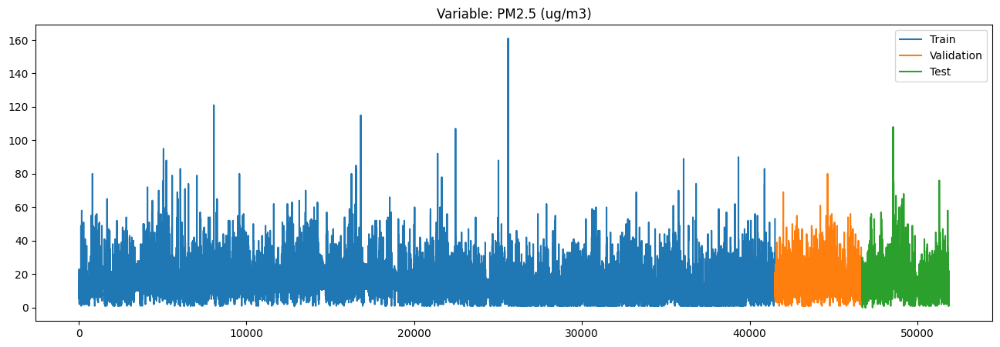

In [10]:
# Variable objetivo
col = "PM2.5 (ug/m3)"

# Figura
fig, ax = plt.subplots(figsize=(16,5))

# Graficar separación temporal - Random Forest
ax.plot(
    train_rf[col],
    label='Train'
)

ax.plot(
    val_rf[col],
    label='Validation'
)

ax.plot(
    test_rf[col],
    label='Test'
)

# Título
ax.set_title(
    f'Variable: {col}'
)

# Leyenda
plt.legend()

# Mostrar gráfico
plt.show()

# **MODELOS DE MACHINE LEARNING**

# 1. Random Forest

In [11]:
X_train_rf = train_rf.drop(
    columns=[
        "PM2.5 (ug/m3)",
        "Año",
        "Mes",
        "Día",
        "Hora",
        #"dia_sin",
        #"dia_cos",
        "medio_dia_sin",
        "medio_dia_cos",
        "tercio_dia_sin",
        "tercio_dia_cos",
        "semestre_sin",
        "semestre_cos"
    ]
)

y_train_rf = train_rf[
    "PM2.5 (ug/m3)"
]

X_val_rf = val_rf.drop(
    columns=[
        "PM2.5 (ug/m3)",
        "Año",
        "Mes",
        "Día",
        "Hora",
        #"dia_sin",
        #"dia_cos",
        "medio_dia_sin",
        "medio_dia_cos",
        "tercio_dia_sin",
        "tercio_dia_cos",
        "semestre_sin",
        "semestre_cos"
    ]
)

y_val_rf = val_rf[
    "PM2.5 (ug/m3)"
]

X_test_rf = test_rf.drop(
    columns=[
        "PM2.5 (ug/m3)",
        "Año",
        "Mes",
        "Día",
        "Hora",
        #"dia_sin",
        #"dia_cos",
        "medio_dia_sin",
        "medio_dia_cos",
        "tercio_dia_sin",
        "tercio_dia_cos",
        "semestre_sin",
        "semestre_cos"
    ]
)

y_test_rf = test_rf[
    "PM2.5 (ug/m3)"
]

In [42]:
from sklearn.ensemble import RandomForestRegressor


rf_model = RandomForestRegressor(

    # Número de árboles --> más árboles = más estabilidad
    n_estimators=300,

    # Profundidad máxima --> controla overfitting
    max_depth=12,

    # Mínimo muestras para dividir nodo --> evita divisiones absurdas
    min_samples_split=5,

    # Mínimo muestras por hoja (nodos huerfanos) --> suaviza predicciones
    min_samples_leaf=2,

    # Número de variables por split --> mejora diversidad entre árbole
    max_features='sqrt',

    # Reproducibilidad
    random_state=42,

    # Todos los núcleos CPU
    n_jobs=-1
)

# Entrenamiento
rf_model.fit(
    X_train_rf,
    y_train_rf
)

RandomForestRegressor(max_depth=12, max_features='sqrt', min_samples_leaf=2,
                      min_samples_split=5, n_estimators=300, n_jobs=-1,
                      random_state=42)

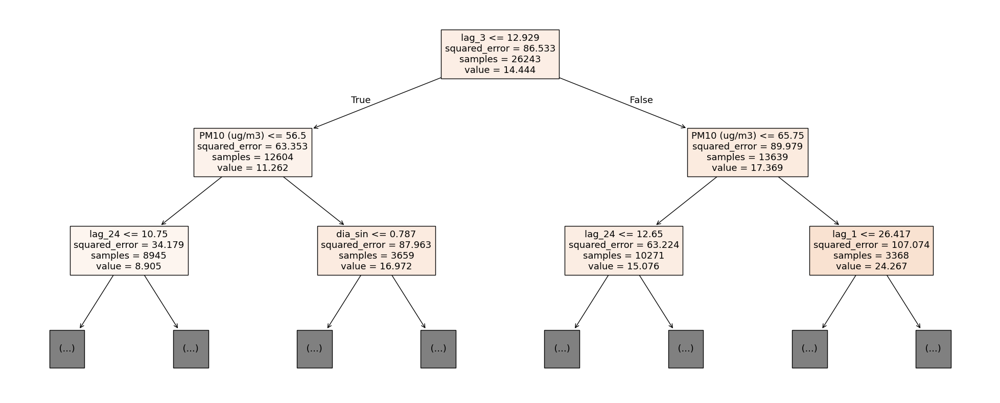

In [43]:
# Tomar un árbol del bosque
one_tree = rf_model.estimators_[0]

# Graficar árbol
plt.figure(figsize=(25,10))

tree.plot_tree(
    one_tree,
    feature_names=X_train_rf.columns,
    filled=True,
    max_depth=2
)

plt.show()

In [44]:
# Predicciones

y_pred_rf = rf_model.predict(
    X_test_rf
)

# Ver primeras predicciones vs valores reales (ambos parten del bloque de test)

print("Predicciones:")
print(y_pred_rf[:10])

print("\nValores reales:")
print(y_test_rf.values[:10])

Predicciones:
[ 9.9033672   8.52391777  6.615657    6.036762    6.80648057  5.25980304
  7.64462494 13.647686   15.90848573 12.27225788]

Valores reales:
[10.  7.  7.  8.  5.  8. 17. 14. 10. 25.]


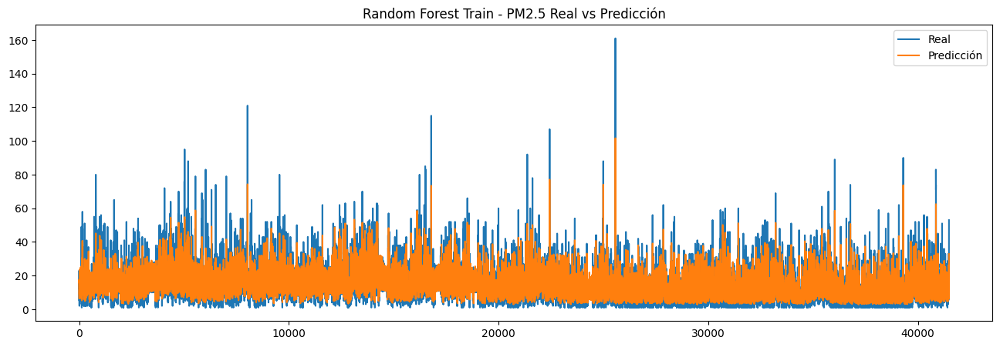

In [45]:
# Predicciones TRAIN
y_pred_train_rf = rf_model.predict(
    X_train_rf
)

# Figura
plt.figure(figsize=(16,5))

# Valores reales
plt.plot(
    y_train_rf.values,
    label="Real"
)

# Predicciones
plt.plot(
    y_pred_train_rf,
    label="Predicción"
)

# Título
plt.title(
    "Random Forest Train - PM2.5 Real vs Predicción"
)

# Leyenda
plt.legend()

plt.show()

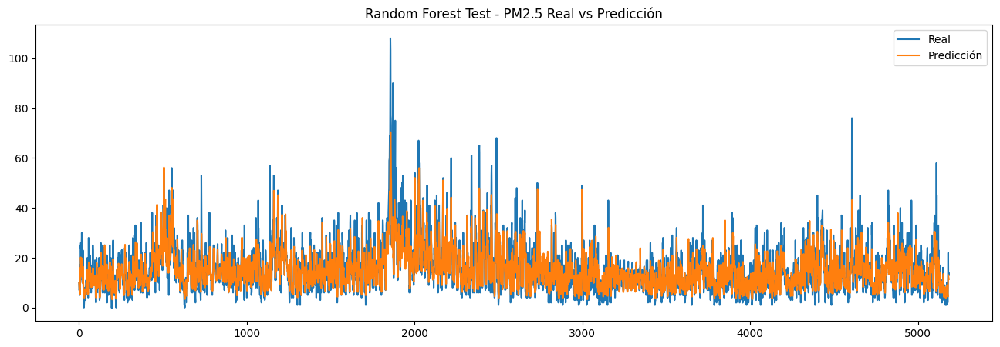

In [46]:
# Figura
plt.figure(figsize=(16,5))

# Valores reales
plt.plot(
    y_test_rf.values,
    label="Real"
)

# Predicciones
plt.plot(
    y_pred_rf,
    label="Predicción"
)

# Título
plt.title(
    "Random Forest Test - PM2.5 Real vs Predicción"
)

# Leyenda
plt.legend()


plt.show()

In [49]:
# =============================
# MÉTRICAS RANDOM FOREST TRAIN
# =============================

# MAE
mae_train_rf = mean_absolute_error(
    y_train_rf,
    y_pred_train_rf
)

# MSE
mse_train_rf = mean_squared_error(
    y_train_rf,
    y_pred_train_rf
)

# RMSE
rmse_train_rf = np.sqrt(
    mse_train_rf
)

# R2
r2_train_rf = r2_score(
    y_train_rf,
    y_pred_train_rf
)

# =============================
# MOSTRAR RESULTADOS
# =============================

print("MAE TRAIN  :", mae_train_rf)
print("MSE TRAIN  :", mse_train_rf)
print("RMSE TRAIN :", rmse_train_rf)
print("R2 TRAIN   :", r2_train_rf)

MAE TRAIN  : 3.362201319602325
MSE TRAIN  : 22.131517654484142
RMSE TRAIN : 4.70441469839598
R2 TRAIN   : 0.746020315335783


In [48]:
# =============================
# MÉTRICAS RANDOM FOREST TEST
# =============================

# MAE
mae_rf = mean_absolute_error(
    y_test_rf,
    y_pred_rf
)

# MSE
mse_rf = mean_squared_error(
    y_test_rf,
    y_pred_rf
)

# RMSE
rmse_rf = np.sqrt(mse_rf)


# R2
r2_rf = r2_score(
    y_test_rf,
    y_pred_rf
)

# =============================
# MOSTRAR RESULTADOS
# =============================

print("MAE TEST:", mae_rf)
print("MSE TEST:", mse_rf)
print("RMSE TEST:", rmse_rf)
print("R2 TEST:", r2_rf)

MAE TEST: 3.7621931053383135
MSE TEST: 28.331177433745044
RMSE TEST: 5.322703958867621
R2 TEST: 0.708089675658133


# 2. XGBoost

In [126]:
X_train_xgb = train_xgb.drop(
    columns=[
        "PM2.5 (ug/m3)",
        "Año",
        "Mes",
        "Día",
        "Hora",
        #"dia_sin",
        #"dia_cos",
        "medio_dia_sin",
        "medio_dia_cos",
        "tercio_dia_sin",
        "tercio_dia_cos",
        "semestre_sin",
        "semestre_cos"
    ]
)

y_train_xgb = train_xgb[
    "PM2.5 (ug/m3)"
]

X_val_xgb = val_xgb.drop(
    columns=[
        "PM2.5 (ug/m3)",
        "Año",
        "Mes",
        "Día",
        "Hora",
        #"dia_sin",
        #"dia_cos",
        "medio_dia_sin",
        "medio_dia_cos",
        "tercio_dia_sin",
        "tercio_dia_cos",
        "semestre_sin",
        "semestre_cos"
    ]
)

y_val_xgb = val_xgb[
    "PM2.5 (ug/m3)"
]

X_test_xgb = test_xgb.drop(
    columns=[
        "PM2.5 (ug/m3)",
        "Año",
        "Mes",
        "Día",
        "Hora",
        #"dia_sin",
        #"dia_cos",
        "medio_dia_sin",
        "medio_dia_cos",
        "tercio_dia_sin",
        "tercio_dia_cos",
        "semestre_sin",
        "semestre_cos"
    ]
)

y_test_xgb = test_xgb[
    "PM2.5 (ug/m3)"
]

In [127]:
from xgboost import XGBRegressor

# =============================
# MODELO XGBOOST MEJORADO
# =============================

xgb_model = XGBRegressor(

    # Más árboles
    n_estimators=500,

    # Árboles un poco más profundos
    max_depth=6,

    # Aprendizaje más suave
    learning_rate=0.03,

    # Evita overfitting
    subsample=0.7,

    # Más robustez entre árboles
    colsample_bytree=0.7,

    # Regularización
    reg_alpha=0.5,

    reg_lambda=1.5,

    random_state=42,

    n_jobs=-1
)

# =============================
# ENTRENAMIENTO
# =============================

xgb_model.fit(
    X_train_xgb,
    y_train_xgb
)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.03, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=-1, num_parallel_tree=None, ...)

In [128]:
# =============================
# PREDICCIONES XGBOOST
# =============================

y_pred_xgb = xgb_model.predict(
    X_test_xgb
)

# Ver primeras predicciones vs valores reales
# (ambos parten del bloque de test)

print("Predicciones:")
print(y_pred_xgb[:10])

print("\nValores reales:")
print(y_test_xgb.values[:10])

Predicciones:
[ 9.856774   7.491563   6.059761   5.937798   6.2654595  4.8567004
  7.2095165 13.947652  16.227182  13.393591 ]

Valores reales:
[10.  7.  7.  8.  5.  8. 17. 14. 10. 25.]


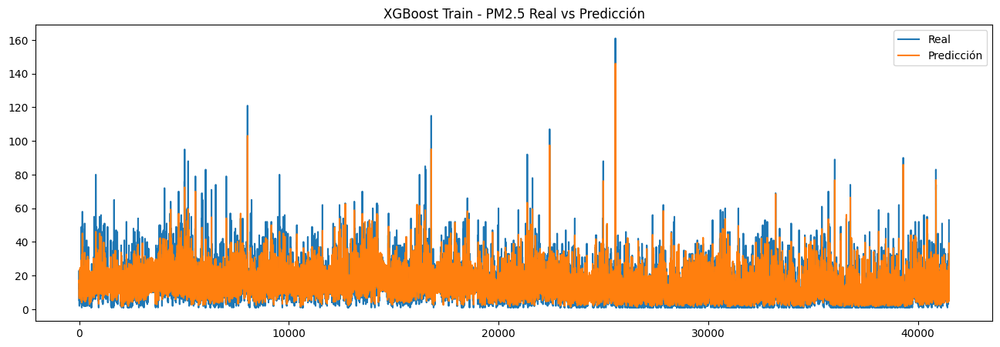

In [131]:
y_pred_train_xgb = xgb_model.predict(
    X_train_xgb
)

plt.figure(figsize=(16,5))

plt.plot(
    y_train_xgb.values,
    label="Real"
)

plt.plot(
    y_pred_train_xgb,
    label="Predicción"
)

plt.title(
    "XGBoost Train - PM2.5 Real vs Predicción"
)

plt.legend()

plt.show()

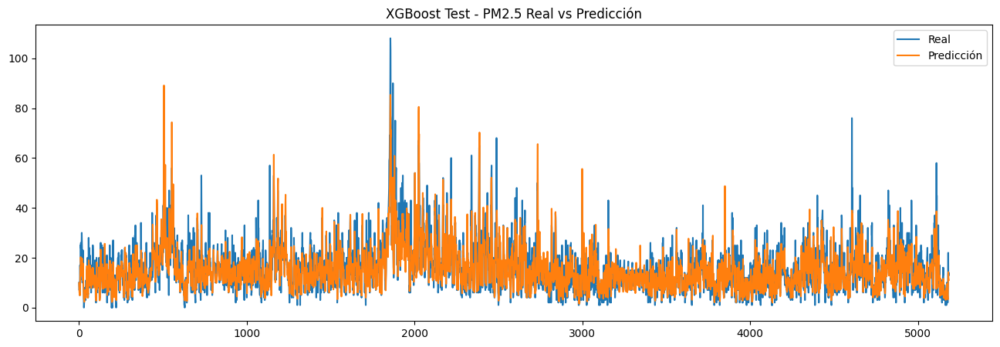

In [132]:
plt.figure(figsize=(16,5))

plt.plot(
    y_test_xgb.values,
    label="Real"
)

plt.plot(
    y_pred_xgb,
    label="Predicción"
)

plt.title(
    "XGBoost Test - PM2.5 Real vs Predicción"
)

plt.legend()

plt.show()

In [133]:
# =============================
# MÉTRICAS XGBOOST TRAIN
# =============================

# MAE
mae_train_xgb = mean_absolute_error(
    y_train_xgb,
    y_pred_train_xgb
)

# MSE
mse_train_xgb = mean_squared_error(
    y_train_xgb,
    y_pred_train_xgb
)

# RMSE
rmse_train_xgb = np.sqrt(
    mse_train_xgb
)

# R2
r2_train_xgb = r2_score(
    y_train_xgb,
    y_pred_train_xgb
)

# =============================
# MOSTRAR RESULTADOS
# =============================

print("MAE TRAIN  :", mae_train_xgb)
print("MSE TRAIN  :", mse_train_xgb)
print("RMSE TRAIN :", rmse_train_xgb)
print("R2 TRAIN   :", r2_train_xgb)

MAE TRAIN  : 3.486562683676094
MSE TRAIN  : 23.58678302682342
RMSE TRAIN : 4.85662259464573
R2 TRAIN   : 0.729319795916384


In [134]:
# =============================
# MÉTRICAS XGBOOST TEST
# =============================

# MAE
mae_xgb = mean_absolute_error(
    y_test_xgb,
    y_pred_xgb
)

# MSE
mse_xgb = mean_squared_error(
    y_test_xgb,
    y_pred_xgb
)

# RMSE
rmse_xgb = np.sqrt(mse_xgb)

# R2
r2_xgb = r2_score(
    y_test_xgb,
    y_pred_xgb
)

# =============================
# MOSTRAR RESULTADOS
# =============================

print("MAE TEST:", mae_xgb)
print("MSE TEST:", mse_xgb)
print("RMSE TEST:", rmse_xgb)
print("R2 TEST:", r2_xgb)

MAE TEST: 3.693327439154676
MSE TEST: 26.55704805290385
RMSE TEST: 5.153353088320637
R2 TEST: 0.7263694200915196


# **MODELOS DE DEEP LEARNING**

# 1. LSTM

In [12]:
print(train_lstm.columns)

Index(['PM10 (ug/m3)', 'PM2.5 (ug/m3)', 'O3 (ug/m3)', 'Temperatura (°C)',
       'Humedad (%)', 'Radiacion Solar (W/m2)', 'Lluvia (mm)', 'Wx', 'Wy',
       'dia_sin', 'dia_cos', 'medio_dia_sin', 'medio_dia_cos',
       'tercio_dia_sin', 'tercio_dia_cos', 'semestre_sin', 'semestre_cos',
       'Año', 'Mes', 'Día', 'Hora'],
      dtype='object')


In [13]:
# =============================
# PM2.5 COMO PRIMERA COLUMNA
# =============================
# Se eliminan:
# Año, Mes, Día y Hora
# porque ya están representadas
# mediante variables cíclicas sin/cos
# =============================

columnas_lstm = [

    'PM2.5 (ug/m3)',
    'PM10 (ug/m3)',
    'O3 (ug/m3)',

    'Temperatura (°C)',
    'Humedad (%)',
    'Radiacion Solar (W/m2)',
    'Lluvia (mm)',

    'Wx',
    'Wy',

    'dia_sin',
    'dia_cos',

    'medio_dia_sin',
    'medio_dia_cos',

    'tercio_dia_sin',
    'tercio_dia_cos',

    'semestre_sin',
    'semestre_cos'

]

train_lstm = (
    train_lstm[columnas_lstm]
)

val_lstm = (
    val_lstm[columnas_lstm]
)

test_lstm = (
    test_lstm[columnas_lstm]
)

# =============================
# VERIFICAR
# =============================

print("Train:", train_lstm.shape)
print("Validation:", val_lstm.shape)
print("Test:", test_lstm.shape)

Train: (41501, 17)
Validation: (5187, 17)
Test: (5189, 17)


In [14]:
print(train_lstm.columns)

Index(['PM2.5 (ug/m3)', 'PM10 (ug/m3)', 'O3 (ug/m3)', 'Temperatura (°C)',
       'Humedad (%)', 'Radiacion Solar (W/m2)', 'Lluvia (mm)', 'Wx', 'Wy',
       'dia_sin', 'dia_cos', 'medio_dia_sin', 'medio_dia_cos',
       'tercio_dia_sin', 'tercio_dia_cos', 'semestre_sin', 'semestre_cos'],
      dtype='object')


# **CREAR DATASET SUPERVISADO**

In [15]:
# =============================
# DATASET SUPERVISADO
# =============================

def crear_dataset_supervisado(
    array,
    input_length,
    output_length
):
    '''
    Crea un dataset supervisado para LSTM
    usando PM2.5 como variable objetivo.
    '''

    X = []
    Y = []

    shape = array.shape

    if len(shape) == 1:

        fils = array.shape[0]
        cols = 1

        array = array.reshape(
            fils,
            cols
        )

    else:

        fils, cols = array.shape

    for i in range(
        fils - input_length - output_length
    ):

        X.append(
            array[
                i:i + input_length,
                0:cols
            ]
        )

        Y.append(
            array[
                i + input_length:
                i + input_length + output_length,
                0
            ].reshape(
                output_length,
                1
            )
        )

    X = np.array(X)
    Y = np.array(Y)

    return X, Y

In [16]:
# =============================
# VENTANAS TEMPORALES
# =============================

INPUT_LENGTH = 48
OUTPUT_LENGTH = 1

# =============================
# TRAIN
# =============================

x_train_lstm, y_train_lstm = (
    crear_dataset_supervisado(
        train_lstm.values,
        INPUT_LENGTH,
        OUTPUT_LENGTH
    )
)

# =============================
# VALIDATION
# =============================

x_val_lstm, y_val_lstm = (
    crear_dataset_supervisado(
        val_lstm.values,
        INPUT_LENGTH,
        OUTPUT_LENGTH
    )
)

# =============================
# TEST
# =============================

x_test_lstm, y_test_lstm = (
    crear_dataset_supervisado(
        test_lstm.values,
        INPUT_LENGTH,
        OUTPUT_LENGTH
    )
)

# =============================
# VERIFICAR DIMENSIONES
# =============================

print(
    "Tamaños entrada (BATCHES x INPUT_LENGTH x FEATURES)"
)

print(
    "Tamaños salida (BATCHES x OUTPUT_LENGTH x 1)"
)

print(
    f"Train -> X: {x_train_lstm.shape}, Y: {y_train_lstm.shape}"
)

print(
    f"Validation -> X: {x_val_lstm.shape}, Y: {y_val_lstm.shape}"
)

print(
    f"Test -> X: {x_test_lstm.shape}, Y: {y_test_lstm.shape}"
)

Tamaños entrada (BATCHES x INPUT_LENGTH x FEATURES)
Tamaños salida (BATCHES x OUTPUT_LENGTH x 1)
Train -> X: (41452, 48, 17), Y: (41452, 1, 1)
Validation -> X: (5138, 48, 17), Y: (5138, 1, 1)
Test -> X: (5140, 48, 17), Y: (5140, 1, 1)


# **ESCALAMIENTO**

In [17]:
# =============================
# ESCALAMIENTO DEL DATASET
# =============================

from sklearn.preprocessing import MinMaxScaler
import numpy as np

def escalar_dataset(data_input):

    # Número de variables
    NFEATS = data_input['x_train'].shape[2]

    # Un scaler por variable
    scalers = [
        MinMaxScaler(feature_range=(-1, 1))
        for _ in range(NFEATS)
    ]

    # Arreglos escalados
    x_train_s = np.zeros(data_input['x_train'].shape)

    x_val_s = np.zeros(
        data_input['x_val'].shape
    )

    x_test_s = np.zeros(
        data_input['x_test'].shape
    )

    y_train_s = np.zeros(
        data_input['y_train'].shape
    )

    y_val_s = np.zeros(
        data_input['y_val'].shape
    )

    y_test_s = np.zeros(
        data_input['y_test'].shape
    )

    # =====================================
    # COLUMNAS QUE SÍ SE ESCALAN
    # =====================================
    #
    # 0  -> PM2.5
    # 1  -> PM10
    # 2  -> O3
    # 3  -> Temperatura
    # 4  -> Humedad
    # 5  -> Radiacion Solar
    # 6  -> Lluvia
    # 7  -> Wx
    # 8  -> Wy
    #
    FEAT_IDS = list(range(0, 9))

    # =====================================
    # COLUMNAS QUE NO SE ESCALAN
    # =====================================
    #
    # 9  -> dia_sin
    # 10 -> dia_cos
    # 11 -> medio_dia_sin
    # 12 -> medio_dia_cos
    # 13 -> tercio_dia_sin
    # 14 -> tercio_dia_cos
    # 15 -> semestre_sin
    # 16 -> semestre_cos
    #
    FEATS_TIME = list(range(9, 17))

    # =====================================
    # ESCALAR X
    # =====================================

    for i in FEAT_IDS:

        x_train_s[:, :, i] = (
            scalers[i].fit_transform(
                data_input['x_train'][:, :, i]
            )
        )

        x_val_s[:, :, i] = (
            scalers[i].transform(
                data_input['x_val'][:, :, i]
            )
        )

        x_test_s[:, :, i] = (
            scalers[i].transform(
                data_input['x_test'][:, :, i]
            )
        )

    # =====================================
    # DEJAR VARIABLES CÍCLICAS IGUALES
    # =====================================

    x_train_s[:, :, FEATS_TIME] = (
        data_input['x_train'][:, :, FEATS_TIME]
    )

    x_val_s[:, :, FEATS_TIME] = (
        data_input['x_val'][:, :, FEATS_TIME]
    )

    x_test_s[:, :, FEATS_TIME] = (
        data_input['x_test'][:, :, FEATS_TIME]
    )

    # =====================================
    # ESCALAR Y (PM2.5)
    # =====================================

    scaler_pm25 = MinMaxScaler(
        feature_range=(-1, 1)
    )

    scaler_pm25.fit(
        data_input['y_train'][:, :, 0].reshape(-1, 1)
    )

    y_train_s[:, :, 0] = (
        scaler_pm25.transform(
            data_input['y_train'][:, :, 0].reshape(-1, 1)
        ).reshape(
            data_input['y_train'].shape[0],
            data_input['y_train'].shape[1]
        )
    )

    y_val_s[:, :, 0] = (
        scaler_pm25.transform(
            data_input['y_val'][:, :, 0].reshape(-1, 1)
        ).reshape(
            data_input['y_val'].shape[0],
            data_input['y_val'].shape[1]
        )
    )

    y_test_s[:, :, 0] = (
        scaler_pm25.transform(
            data_input['y_test'][:, :, 0].reshape(-1, 1)
        ).reshape(
            data_input['y_test'].shape[0],
            data_input['y_test'].shape[1]
        )
    )

    # =====================================
    # DICCIONARIO DE SALIDA
    # =====================================

    data_scaled = {

        'x_train_s': x_train_s,
        'y_train_s': y_train_s,

        'x_val_s': x_val_s,
        'y_val_s': y_val_s,

        'x_test_s': x_test_s,
        'y_test_s': y_test_s

    }

    return data_scaled, scaler_pm25

In [18]:
# =============================
# DICCIONARIO DE ENTRADA
# =============================

data_in = {

    'x_train': x_train_lstm,
    'y_train': y_train_lstm,

    'x_val': x_val_lstm,
    'y_val': y_val_lstm,

    'x_test': x_test_lstm,
    'y_test': y_test_lstm

}

# =============================
# ESCALAR DATASET
# =============================

data_s, scaler_pm25 = (
    escalar_dataset(data_in)
)

# =============================
# EXTRAER DATASETS ESCALADOS
# =============================

x_train_s = data_s['x_train_s']
y_train_s = data_s['y_train_s']

x_val_s = data_s['x_val_s']
y_val_s = data_s['y_val_s']

x_test_s = data_s['x_test_s']
y_test_s = data_s['y_test_s']

In [19]:
print("x_train_s:", x_train_s.shape)
print("y_train_s:", y_train_s.shape)

print("x_val_s:", x_val_s.shape)
print("y_val_s:", y_val_s.shape)

print("x_test_s:", x_test_s.shape)
print("y_test_s:", y_test_s.shape)

x_train_s: (41452, 48, 17)
y_train_s: (41452, 1, 1)
x_val_s: (5138, 48, 17)
y_val_s: (5138, 1, 1)
x_test_s: (5140, 48, 17)
y_test_s: (5140, 1, 1)


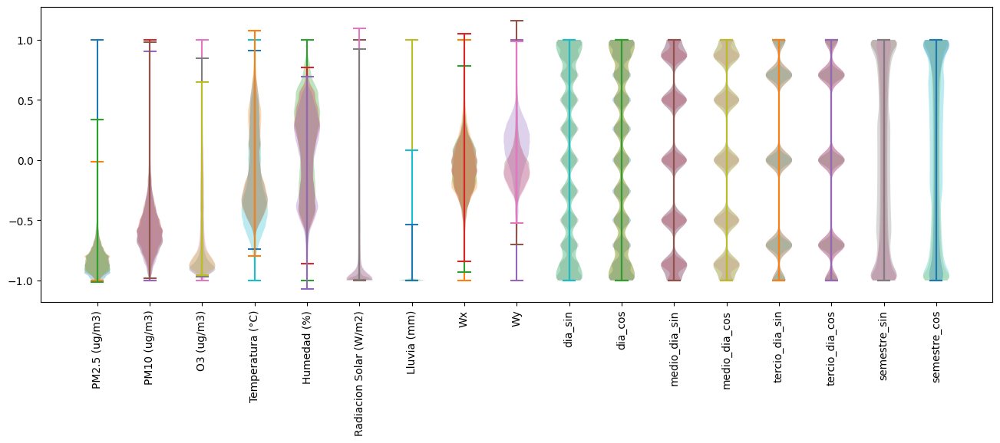

In [20]:
# =============================
# DISTRIBUCIÓN DE VARIABLES
# =============================

fig, ax = plt.subplots(
    figsize=(16,5)
)

for i in range(
    len(columnas_lstm)
):

    ax.violinplot(
        dataset=x_train_s[:,:,i].flatten(),
        positions=[i]
    )

    ax.violinplot(
        dataset=x_val_s[:,:,i].flatten(),
        positions=[i]
    )

    ax.violinplot(
        dataset=x_test_s[:,:,i].flatten(),
        positions=[i]
    )

# Etiquetas eje X
ax.set_xticks(
    list(range(len(columnas_lstm)))
)

ax.set_xticklabels(
    columnas_lstm,
    rotation=90
)

ax.autoscale()

plt.show()

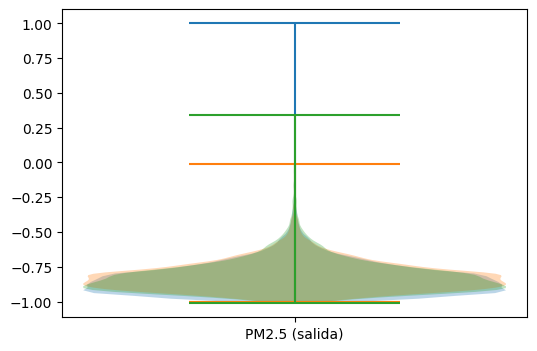

In [21]:
# =============================
# DISTRIBUCIÓN VARIABLE OBJETIVO
# =============================

fig, ax = plt.subplots(
    figsize=(6,4)
)

ax.violinplot(
    dataset=y_train_s.flatten()
)

ax.violinplot(
    dataset=y_val_s.flatten()
)

ax.violinplot(
    dataset=y_test_s.flatten()
)

ax.set_xticks([1])

ax.set_xticklabels(
    ['PM2.5 (salida)']
)

plt.show()

In [22]:
print(y_train_s.shape)

(41452, 1, 1)


# **MODELO**

In [29]:
# =============================
# MODELO LSTM
# =============================

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf

# =============================
# REPRODUCIBILIDAD
# =============================

tf.random.set_seed(123)
tf.config.experimental.enable_op_determinism()

# =============================
# ARQUITECTURA
# =============================

N_UNITS = 128

INPUT_SHAPE = (
    x_train_s.shape[1],  # 24 horas
    x_train_s.shape[2]   # 17 variables
)

modelo = Sequential()

modelo.add(
    LSTM(
        units=N_UNITS,
        input_shape=INPUT_SHAPE
    )
)

# Predicción de la próxima hora
modelo.add(
    Dense(
        OUTPUT_LENGTH,
        activation='linear'
    )
)

# =============================
# FUNCIÓN DE PÉRDIDA (RMSE)
# =============================

def root_mean_squared_error(
    y_true,
    y_pred
):

    rmse = tf.math.sqrt(
        tf.math.reduce_mean(
            tf.square(
                y_pred - y_true
            )
        )
    )

    return rmse

# =============================
# COMPILACIÓN
# =============================

optimizador = Adam(
    learning_rate=1e-3
)

modelo.compile(
    optimizer=optimizador,
    loss=root_mean_squared_error
)

# =============================
# EARLY STOPPING
# =============================

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

# =============================
# RESUMEN DEL MODELO
# =============================

modelo.summary()

# =============================
# ENTRENAMIENTO
# =============================

EPOCHS = 100
BATCH_SIZE = 256

historia = modelo.fit(
    x=x_train_s,
    y=y_train_s,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=(
        x_val_s,
        y_val_s
    ),
    callbacks=[
        early_stop
    ],
    verbose=2
)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_1 (LSTM)                   │ (None, 128)            │        74,752 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 74,881 (292.50 KB)

 Trainable params: 74,881 (292.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
162/162 - 5s - 29ms/step - loss: 0.1088 - val_loss: 0.0813
Epoch 2/100
162/162 - 1s - 8ms/step - loss: 0.0858 - val_loss: 0.0801
Epoch 3/100
162/162 - 1s - 7ms/step - loss: 0.0831 - val_loss: 0.0788
Epoch 4/100
162/162 - 1s - 7ms/step - loss: 0.0815 - val_loss: 0.0781
Epoch 5/100
162/162 - 1s - 7ms/step - loss: 0.0806 - val_loss: 0.0778
Epoch 6/100
162/162 - 1s - 7ms/step - loss: 0.0801 - val_loss: 0.0774
Epoch 7/100
162/162 - 1s - 7ms/step - loss: 0.0797 - val_loss: 0.0771
Epoch 8/100
162/162 - 1s - 7ms/step - loss: 0.0794 - val_loss: 0.0770
Epoch 9/100
162/162 - 1s - 8ms/step - loss: 0.0792 - val_loss: 0.0768
Epoch 10/100
162/162 - 2s - 15ms/step - loss: 0.0790 - val_loss: 0.0767
Epoch 11/100
162/162 - 1s - 7ms/step - loss: 0.0789 - val_loss: 0.0765
Epoch 12/100
162/162 - 1s - 7ms/step - loss: 0.0788 - val_loss: 0.0764
Epoch 13/100
162/162 - 1s - 7ms/step - loss: 0.0786 - val_loss: 0.0763
Epoch 14/100
162/162 - 1s - 7ms/step - loss: 0.0785 - val_loss: 0.0761
Epoch 15/100


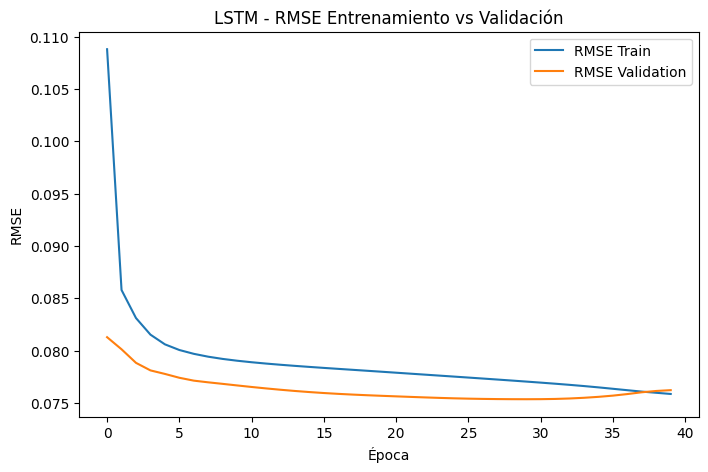

In [30]:
# =============================
# CURVAS DE ENTRENAMIENTO
# =============================

plt.figure(figsize=(8,5))

plt.plot(
    historia.history['loss'],
    label='RMSE Train'
)

plt.plot(
    historia.history['val_loss'],
    label='RMSE Validation'
)

plt.xlabel(
    'Época'
)

plt.ylabel(
    'RMSE'
)

plt.title(
    'LSTM - RMSE Entrenamiento vs Validación'
)

plt.legend()

plt.show()

In [31]:
# =============================
# RMSE TRAIN / VALIDATION / TEST
# =============================

rmse_train = modelo.evaluate(
    x=x_train_s,
    y=y_train_s,
    verbose=0
)

rmse_val = modelo.evaluate(
    x=x_val_s,
    y=y_val_s,
    verbose=0
)

rmse_test = modelo.evaluate(
    x=x_test_s,
    y=y_test_s,
    verbose=0
)

# =============================
# RESULTADOS
# =============================

print("Comparativo desempeños:")

print(
    f"RMSE Train      : {rmse_train:.4f}"
)

print(
    f"RMSE Validation : {rmse_val:.4f}"
)

print(
    f"RMSE Test       : {rmse_test:.4f}"
)

Comparativo desempeños:
RMSE Train      : 0.0723
RMSE Validation : 0.0723
RMSE Test       : 0.0756


# **INVERSE SCALING**

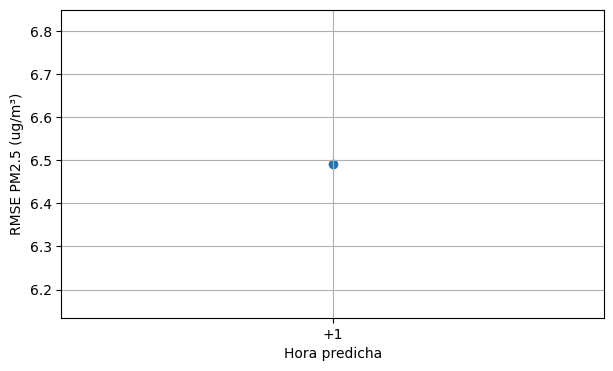

RMSE Test: 6.4919 ug/m³


In [32]:
# =============================
# PREDICCIONES TEST
# =============================

# 1. Predicción sobre el conjunto de prueba
y_test_pred_s = modelo.predict(
    x_test_s,
    verbose=0
)

# =============================
# TRANSFORMACIÓN INVERSA
# =============================

# Predicciones
y_test_pred = scaler_pm25.inverse_transform(
    y_test_pred_s.reshape(-1, 1)
).reshape(
    y_test_pred_s.shape
)

# Valores reales
y_test_real = scaler_pm25.inverse_transform(
    y_test_s.reshape(-1, 1)
).reshape(
    y_test_s.shape
)

# Eliminar dimensiones sobrantes
y_test_real = y_test_real.squeeze()
y_test_pred = y_test_pred.squeeze()

# =============================
# RMSE TEST (ESCALA REAL)
# =============================

rmse = np.sqrt(
    np.mean(
        np.square(
            y_test_real - y_test_pred
        )
    )
)

# =============================
# GRÁFICA
# =============================

fig, ax = plt.subplots(
    figsize=(7,4)
)

ax.scatter(
    [1],
    [rmse]
)

ax.set_xlabel(
    'Hora predicha'
)

ax.set_ylabel(
    'RMSE PM2.5 (ug/m³)'
)

ax.set_xticks([1])

ax.set_xticklabels(
    ['+1']
)

plt.grid()

plt.show()

# =============================
# IMPRIMIR RMSE
# =============================

print(
    f'RMSE Test: {rmse:.4f} ug/m³'
)

In [33]:
# =============================
# PREDICCIONES TRAIN
# =============================

y_train_pred_s = modelo.predict(
    x_train_s,
    verbose=0
)

# Desescalar predicciones
y_train_pred = scaler_pm25.inverse_transform(
    y_train_pred_s.reshape(-1,1)
).reshape(
    y_train_pred_s.shape
)

# Desescalar valores reales
y_train_real = scaler_pm25.inverse_transform(
    y_train_s.reshape(-1,1)
).reshape(
    y_train_s.shape
)

# =============================
# MÉTRICAS TRAIN
# =============================

y_real_train = y_train_real.flatten()
y_pred_train = y_train_pred.flatten()

mae_train_lstm = mean_absolute_error(
    y_real_train,
    y_pred_train
)

mse_train_lstm = mean_squared_error(
    y_real_train,
    y_pred_train
)

rmse_train_lstm = np.sqrt(
    mse_train_lstm
)

r2_train_lstm = r2_score(
    y_real_train,
    y_pred_train
)

# =============================
# RESULTADOS
# =============================

print("MAE TRAIN  :", mae_train_lstm)
print("MSE TRAIN  :", mse_train_lstm)
print("RMSE TRAIN :", rmse_train_lstm)
print("R2 TRAIN   :", r2_train_lstm)

MAE TRAIN  : 4.363568068599546
MSE TRAIN  : 38.12496069696571
RMSE TRAIN : 6.174541334946727
R2 TRAIN   : 0.5624889017508643


In [34]:
# =============================
# MÉTRICAS LSTM TEST
# =============================

from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score
)

# Convertir a vectores
y_real = y_test_real.flatten()
y_pred = y_test_pred.flatten()

# MAE
mae_lstm = mean_absolute_error(
    y_real,
    y_pred
)

# MSE
mse_lstm = mean_squared_error(
    y_real,
    y_pred
)

# RMSE
rmse_lstm = np.sqrt(
    mse_lstm
)

# R2
r2_lstm = r2_score(
    y_real,
    y_pred
)

# =============================
# MOSTRAR RESULTADOS
# =============================

print("MAE TEST :", mae_lstm)
print("MSE TEST :", mse_lstm)
print("RMSE TEST:", rmse_lstm)
print("R2 TEST  :", r2_lstm)

MAE TEST : 4.664997472305396
MSE TEST : 42.14454712399284
RMSE TEST: 6.491883172392495
R2 TEST  : 0.5664692006205234


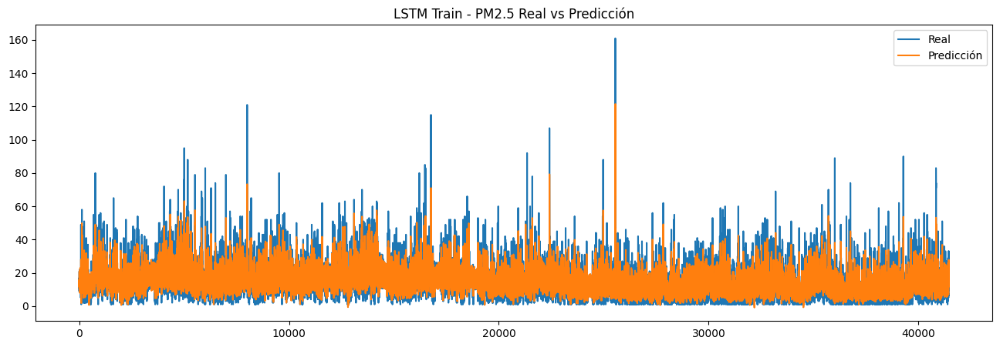

In [35]:
# =============================
# LSTM TRAIN
# =============================

plt.figure(figsize=(16,5))

plt.plot(
    y_train_real.flatten(),
    label="Real"
)

plt.plot(
    y_train_pred.flatten(),
    label="Predicción"
)

plt.title(
    "LSTM Train - PM2.5 Real vs Predicción"
)

plt.legend()

plt.show()

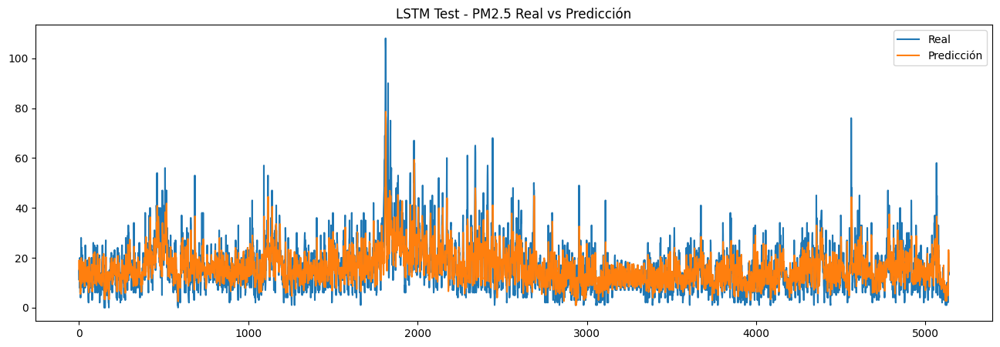

In [36]:
# =============================
# LSTM TEST
# =============================

plt.figure(figsize=(16,5))

plt.plot(
    y_test_real.flatten(),
    label="Real"
)

plt.plot(
    y_test_pred.flatten(),
    label="Predicción"
)

plt.title(
    "LSTM Test - PM2.5 Real vs Predicción"
)

plt.legend()

plt.show()